In [1]:
import os
from itertools import compress
from pathlib import Path

import autoreject
import matplotlib.pyplot as plt
import mne
import numpy as np
import pandas as pd
import seaborn as sns
import tqdm
from autoreject import get_rejection_threshold
from scipy.integrate import simpson
from Settings import *
from utils import *

In [2]:
mne.set_log_level(False)
plt.rcParams.update({'figure.max_open_warning': 0})
try:
    mne.cuda.init_cuda(verbose=True)
    mne.utils.set_config('MNE_USE_CUDA', 'true') 
finally:
    cuda=True

Now using CUDA device 0
Enabling CUDA with 5.07 GB available memory


In [3]:
icas = []

lstPIds = []
path = "../Data/"
for filename in os.listdir(path):
    if filename.endswith(".csv"): 
        lstPIds.append(int(filename.split("-")[0].replace("ID", "")))
    else:
        continue
lstPIds = list(set(lstPIds))
print(lstPIds)
print(str(len(lstPIds)) + " subjects")

#for TESTING
if TEST:
    lstPIds = [1, 2]
    lstPIds = list(set(lstPIds))
    NUM_BLOCKS = 2

[1, 2, 3, 5, 6, 7, 9, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]
17 subjects


In [4]:
dir_path = r'./fifs/'
#Path('./fifs/ica').mkdir(parents=True, exist_ok=True)
Path('./fifs/clean').mkdir(parents=True, exist_ok=True)
Path('./pickles').mkdir(parents=True, exist_ok=True)
Path('./Plots/ICA').mkdir(parents=True, exist_ok=True)
Path('./ica/fifs').mkdir(parents=True, exist_ok=True)

arr_epochs = []
arr_ica_epochs = []

if get_num_files(dir_path) != NUM_BLOCKS * len(lstPIds):
    for pid in tqdm.tqdm(lstPIds):
    
        dfState = pd.read_csv(f"{path}ID{pid}-state.csv")    
                    
        dfEEG = pd.read_csv(f"{path}ID{pid}-EEG.csv")
        dfEEG.rename(columns={"Value0": "F3", "Value1": "C3", "Value2": "P3", "Value3": "P4", "Value4": "C4", "Value5": "F4", "Value6": "Pz"}, inplace=True) # actually dont think this is necessary
        dfEEG.drop("TimeLsl", axis = 1, inplace=True)

        dstate = pd.read_csv(f"{path}ID{pid}-state.csv")
        
        dffeedback = pd.read_csv(f"{path}ID{pid}-feedback.csv")
        
        dfAll = pd.merge(dfEEG, dstate, on =["Time"], how="outer")
        dfAll.sort_values(by="Time", inplace=True) # inplace?
        dfAll.drop(columns=["Value7","AdaptationStatus", "NBackN", "State"], inplace=True )
        dfAll.fillna(method='ffill', inplace=True)
        dfAll.drop(dfAll[dfAll.BlockNumber < 0].index, inplace=True)
        dfAll.dropna(inplace=True)

        for x in range(1, NUM_BLOCKS+1):  
            print("pid "  , pid, "block", x)
    
            # Prepare data 
            # see if fif already present, else filter / clean data and save it
                    
            data = dfAll.loc[dfAll['BlockNumber'] == x]
            df = pd.DataFrame(data)

            info = mne.create_info(ch_names=ch_names, sfreq=sfreq, ch_types=ch_types)
            info.set_montage('standard_1020',  match_case=False)

            samples = df.T
            
            raw = mne.io.RawArray(samples, info)
            raw.drop_channels(['Time', 'BlockNumber'])
            
            # remove power line interferance
            raw.notch_filter(50., n_jobs=-1)
            
            # high pass filter to remove slow drifts, 70 Hz low pass
            raw.filter(1., 70, None, fir_design='firwin')
            
            # set EEG reference
            raw.set_eeg_reference('average', projection=True)
            #raw.set_eeg_reference(ref_channels=['Pz'])

            # Visual inspection of bad channels
            # TODO, empty for now. With new setup, check for bad channels only once for all blocks.
            raw.info['bads'] =  bads[pid-1][x-1]
            if raw.info['bads']:
                raw.interpolate_bads()
        
            # Create Annotations:
            dffeedbackBlock = dffeedback.loc[(dffeedback['CurrentBlock'] == x)]
            new_row = pd.DataFrame({'Time':float(dfAll['Time'].loc[(dfAll['BlockNumber']==x)].iloc[0])}, index =[0]) # first ball. kill me. my soul is dead.
            dffeedbackBlock = pd.concat([new_row, dffeedbackBlock]).reset_index(drop = True)            
            spawn_diff = dffeedbackBlock['Time'].diff(periods=1)
            spawn_diff.dropna(inplace=True)
            #spawn_diff[0] = 0  # NOTE: first ball. add later, for now dont add as it's guesswork                               
            spawn_onset = np.cumsum(spawn_diff)
            times = np.full_like(spawn_onset, .1)       
            
            spawn_annot = mne.Annotations(onset=spawn_onset,
                        duration=times,
                        description=['spawn'] * len(spawn_onset))
            raw.set_annotations(spawn_annot)
            
            # Create events
            (events, event_dict) = mne.events_from_annotations(raw)
            
            # Create epochs                
            picks = mne.pick_types(raw.info, eeg=True)
            epochs = mne.Epochs(raw, events, event_id=event_dict, tmin = epochs_tmin, tmax=epochs_tmax, event_repeated='merge',
                baseline=None, preload=True)
            
            del(raw)
                            
            # Global autoreject based on rejection threshold
            reject = get_rejection_threshold(epochs, ch_types = 'eeg', verbose=False)
            #print("The rejection dictionary is %s " %reject)

            #reject['eeg'] *= threshold_multiplier
            epochs.drop_bad(reject=reject)
            #epochs.plot_drop_log()

            #arr_epochs.append(epochs)
            epochs.save('./fifs/' + str(pid) + '-' + str(x) + '-epo.fif', overwrite = True)

        del(dfState, dffeedback, dffeedbackBlock, dfEEG, dfAll)

119


In [5]:
exclude_ic = [] # TODO sure its here?
action = None

for pid in tqdm.tqdm(lstPIds):

    if action == 'no':
        pick_ic_as_template = False
    else:
        if pick_ic_as_template:
            action = get_user_input(valid_response={'no', 'yes'},
                        prompt="Select ICs for ICE corrmap? - yes | no", 
                        err_prompt="Type  \"yes\" or \"no\": \n")
        
        if action == 'no':
            pick_ic_as_template = False
                
    for x in range(1, NUM_BLOCKS+1):  
        
        epochs = mne.read_epochs('./fifs/' + str(pid) + '-' + str(x) + '-epo.fif', preload=True)
        # should probably delete contents first but hey
        if len(os.listdir('./ica/fifs/')) != NUM_BLOCKS * len(lstPIds):
            # independent component analysis (ICA)
            
            ica = mne.preprocessing.ICA(method="fastica",  random_state=97)
            
            #TODO decide later. if yes, dont forget to redo it after ica apply
            local_autoreject = False
            if local_autoreject:
                ar = autoreject.AutoReject(n_jobs=-1,  verbose=True, random_state=11)
                epochs_clean, reject_log = ar.fit_transform(epochs, return_log=True) 
                reject_log.plot('horizontal')
                evoked_bad = epochs[reject_log.bad_epochs].average()
                plt.figure()
                plt.plot(evoked_bad.times, evoked_bad.data.T * 1e6, 'r', zorder=-1)
                epochs_clean.average().plot(axes=plt.gca())
                ica.fit(epochs[~reject_log.bad_epochs], tstep = epochs_tstep)

            ica.fit(epochs)
            ica.save('./ica/fifs/' + str(pid) + '-' + str(x) + '-ica.fif', overwrite = True)
            
        else:
            ica = mne.preprocessing.read_ica('./ica/fifs/' + str(pid) + '-' + str(x) + '-ica.fif')
         
        # Optionally autoreject muscle and eog artifacts
        if (pick_ic_auto):
            #start fresh, else find_bads_muscle fails
            #cur_icas = ica.exclude 
            ica.exclude = []
            
            #TODO check if actually EEG
            ica_z_thresh = 1.96
            eog_indices, eog_scores = ica.find_bads_eog(epochs, 
                                                        ch_name=['FCz'], 
                                                        threshold=ica_z_thresh)
            print(f'Automatically found eye artifact ICA components: {eog_indices}')

            # ica.plot_scores(eog_scores)  
            muscle_idx_auto = []
            
            #TODO make true again, just not with  this data...
            if(True):
                muscle_idx_auto, scores = ica.find_bads_muscle(epochs)
                #ica.plot_scores(scores, exclude=muscle_idx_auto)
                
                print(f'Automatically found muscle artifact ICA components: {muscle_idx_auto}')
            
            for item in muscle_idx_auto + eog_indices :
                if item not in ica.exclude:
                    ica.exclude.append(item)
                    
            #print("excludes are" , ica.exclude)
            #ica.plot_overlay(epochs.average(), exclude=ica.exclude, picks='eeg', title = str(pid) + '-' + str(x) )

        # Pick templates
        #TODO: remove this, ic_selection.py is kinda enough
        if(pick_ic_as_template):
            done = False
            while not done:
                
                ics_old = ica.exclude
                #ica.plot_properties(epochs_ica, dB= True, log_scale= True, psd_args={'fmax':70})
                ica.plot_sources(epochs, block = True, title = str(pid) + '-' + str(x), stop = 360. )
                #ica.plot_overlay(epochs_ica.average(), exclude=ica.exclude, picks='eeg', stop = 360.)
                ica.plot_overlay(epochs.average(), exclude=ica.exclude, picks='eeg', stop = 360.)

                while True:
                    accept = get_user_input(valid_response={'no', 'yes'},
                                            prompt="Accept? - yes | no",
                                            err_prompt = "yes | no")
                    try:
                        if accept == 'yes':
                            ica.save('./ica/'+ str(pid) + '-' + str (x) + '_template-ica.fif', overwrite = True)
                            ica.save('./ica/fifs/' + str(pid) + '-' + str(x) + '-ica.fif', overwrite = True)
                            done = True
                            quit = get_user_input(valid_response={'no', 'yes'},
                                        prompt="Quit? - yes | no",
                                        err_prompt = "yes | no")                   
                            if quit == 'yes':
                                pick_ic_as_template = False
                                break
                            break
                        else:
                            ica.exclude = ics_old # doesn't to anything
                            quit = get_user_input(valid_response={'no', 'yes'},
                                            prompt="Quit? - yes | no",
                                            err_prompt = "yes | no")                       
                            if quit == 'yes':
                                pick_ic_as_template = False
                                done = True
                                break     
                            else:
                                break              
                    except Exception as e:
                        print(e)
        
        # TODO remove save ica from template picker  
        # if there are excludes in ica, template doesnt work :DDDD      
        ica.save('./ica/fifs/' + str(pid) + '-' + str(x) + '-ica.fif', overwrite = True)       
           
        #TODO put this somewhere else
        clean_ica_excludes = False
        if(clean_ica_excludes):
            print("removing excludes")
            ica.exclude = []
            ica.save('./ica/fifs/' + str(pid) + '-' + str(x) + '-ica.fif', overwrite = True)   
              
        #TODO maybe do a size check before appending                                  
        # save the ICAs for the corrmap 
        icas.append(ica)
        arr_epochs.append(epochs)    

100%|██████████| 17/17 [00:01<00:00,  9.94it/s]


In [6]:
if preprocess or len(os.listdir('./fifs/clean/')) != NUM_BLOCKS * len(lstPIds):

    ica_templates = []
    ica_excludes = []

    #count = 0
    dir_path = r'./ica/'
    for path in os.scandir(dir_path):
        if path.is_file():
            ica_template = mne.preprocessing.read_ica(dir_path  + path.name)
            if(ica_template.exclude != []):           
                ica_templates.append(ica_template)
            else:
                os.remove(dir_path + path.name)

    clean_epochs = np.empty((len(lstPIds), NUM_BLOCKS), dtype=object) # remove

    for i, ic_templ in enumerate(ica_templates):
        icas.insert(0,ic_templ) #set template
        for x, excl in enumerate(ica_templates[i].exclude):
            mne.preprocessing.corrmap(icas, [0,excl], label='exclude', threshold=0.9, plot=False)
        icas.pop(0) # remove template.
        
    p = 0
    b = 0
    for i, ica in enumerate(icas):
        b += 1
        p = p + 1 if i % 7 == 0 else p
        if p == 4: p = 5
        if p == 8:  p = 9
        if p == 10: p = 11
        b = 1 if  b == 8 else b
        
        if 'exclude' in ica.labels_:        
            #add autodetected artifacts to exclude
            if(pick_ic_auto):
                for item in  ica.labels_['exclude'] :
                    if item not in ica.exclude:
                        ica.exclude.append(item)
            else:
                ica.exclude = ica.labels_['exclude']
        # else:
        #     print("No templates selected \n")

        #print(p, " ", b, ": Final ICAs to exclude are" ,n.exclude)
        #n.plot_overlay(arr_epochs[i].average(), n.exclude, picks='eeg',  title=("p "+ str(p) +" block " +str(b)))
        
        ica.apply(arr_epochs[i]) # TODO at least i hope so, double check indices. 
        arr_epochs[i].apply_baseline(baseline=(None,0))
        arr_epochs[i].save('./fifs/clean/' + str(p) + '-' + str(b) + '-epo.fif', overwrite = True)

    clean_epochs = np.reshape(arr_epochs, (len(lstPIds),NUM_BLOCKS))
    del(ica_templates)
    
del(arr_epochs, arr_ica_epochs)

c:\Users\p_kar\mne-python\1.2.1_0\lib\site-packages\numpy\core\fromnumeric.py:43: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = getattr(asarray(obj), method)(*args, **kwds)


  0%|          | 0/17 [00:00<?, ?it/s]

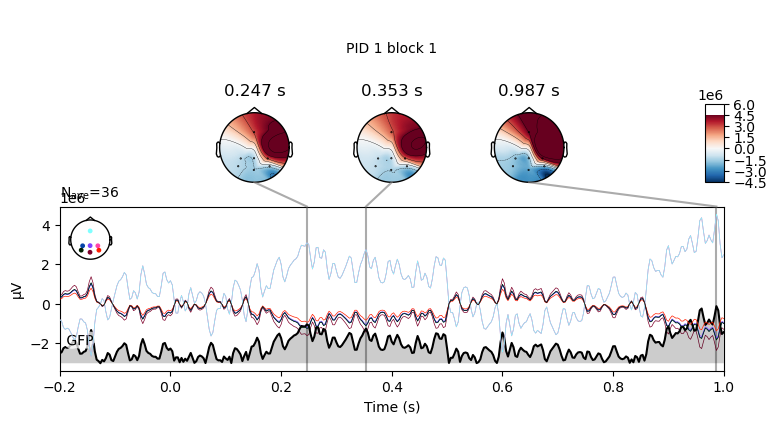

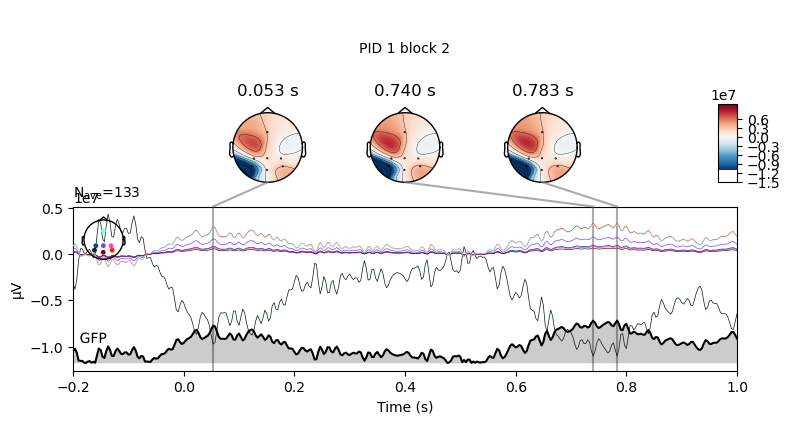

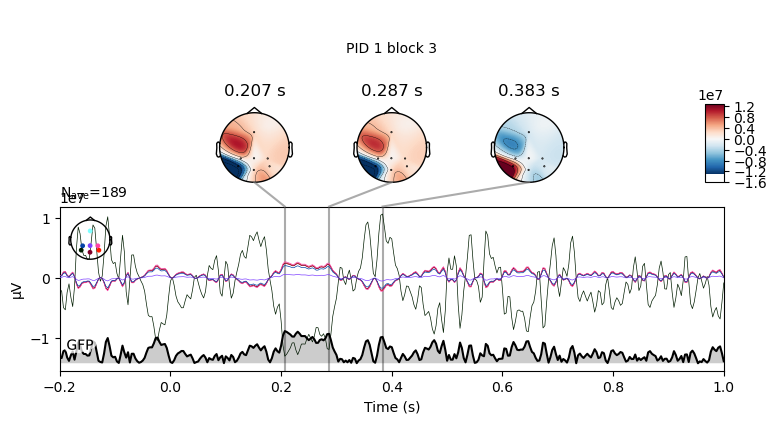

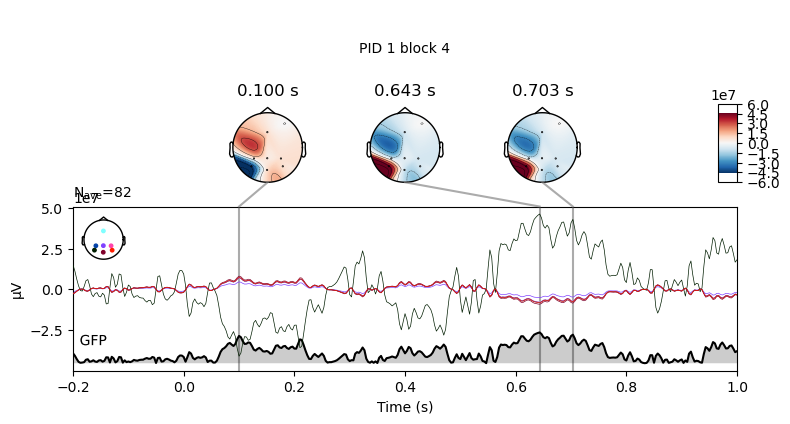

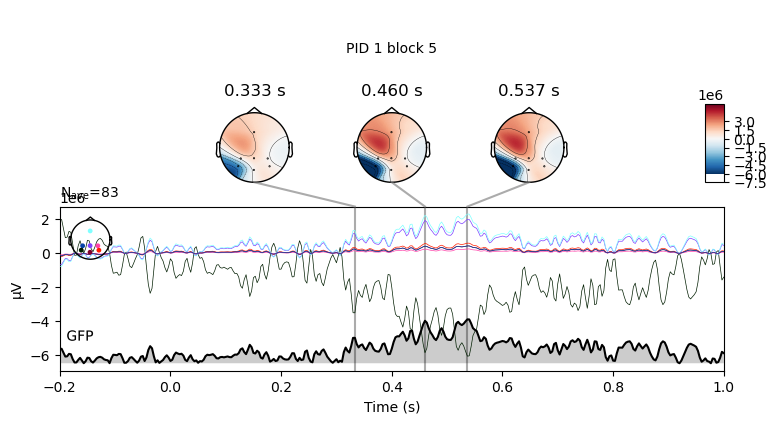

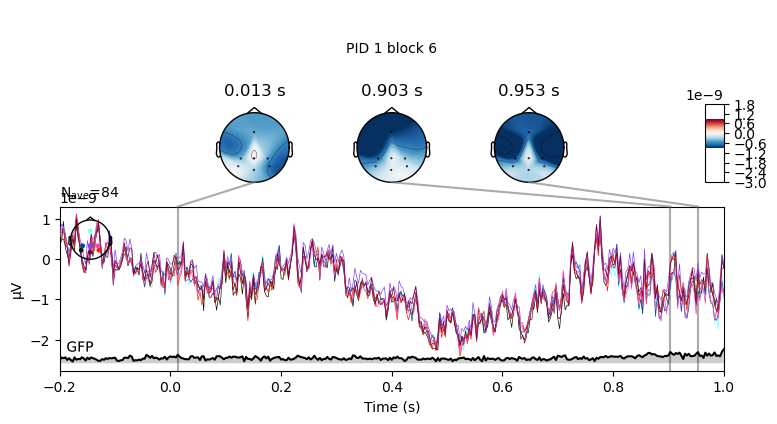

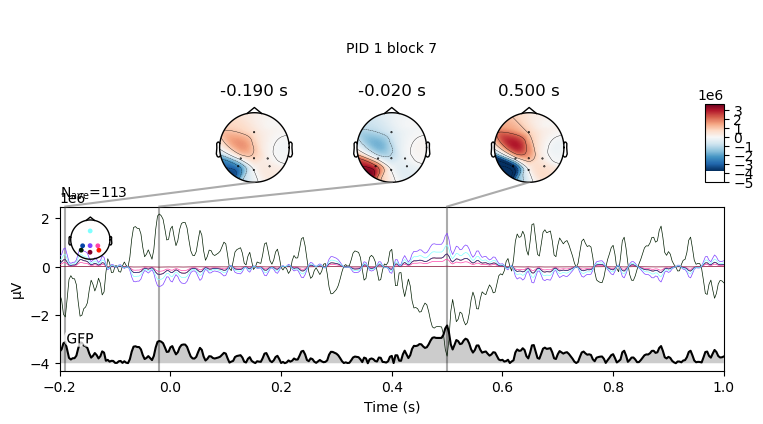

  6%|▌         | 1/17 [00:04<01:07,  4.20s/it]

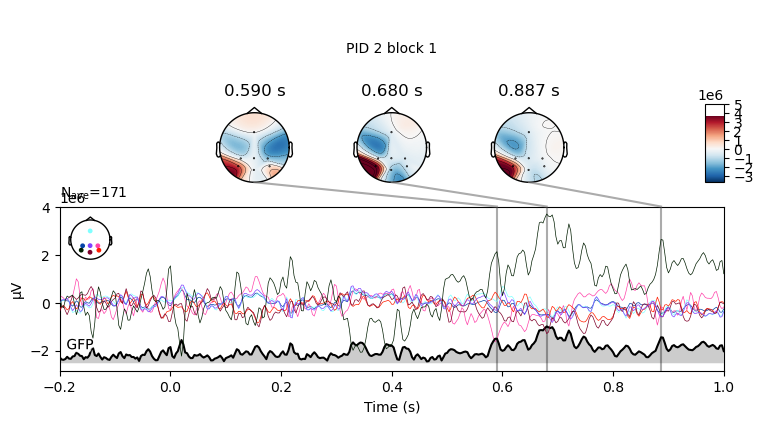

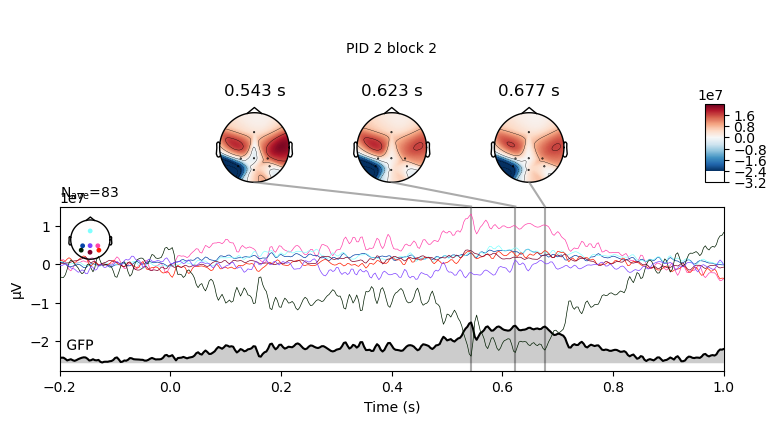

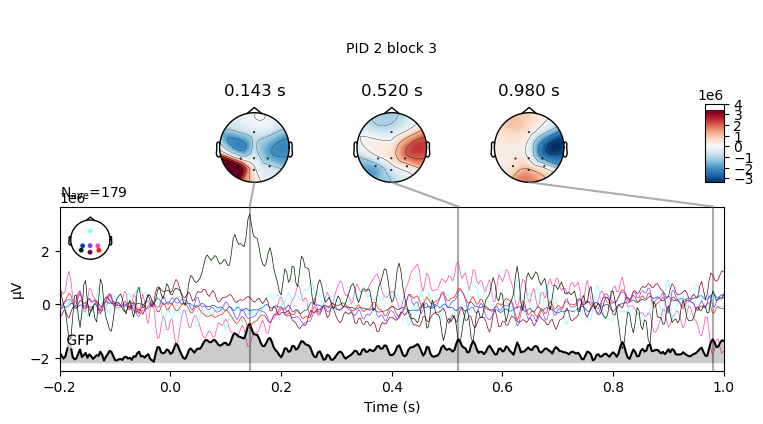

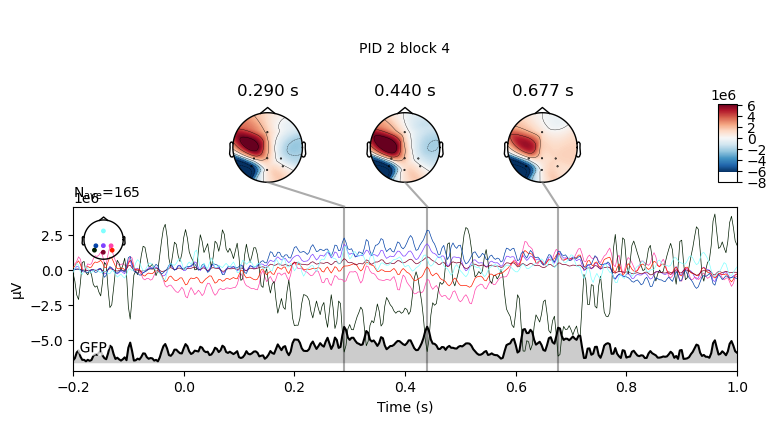

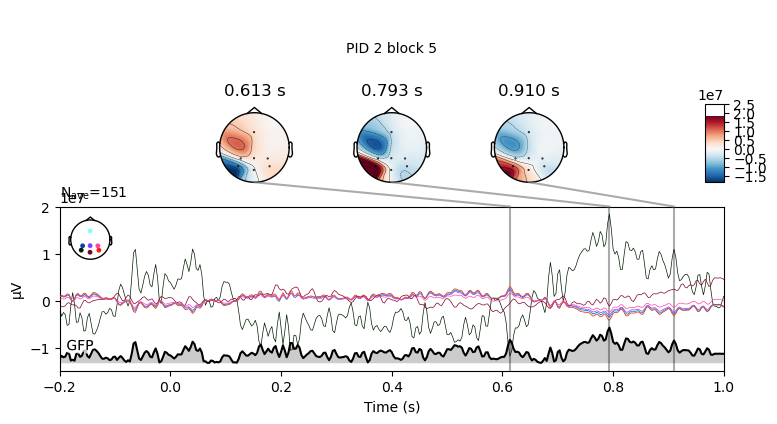

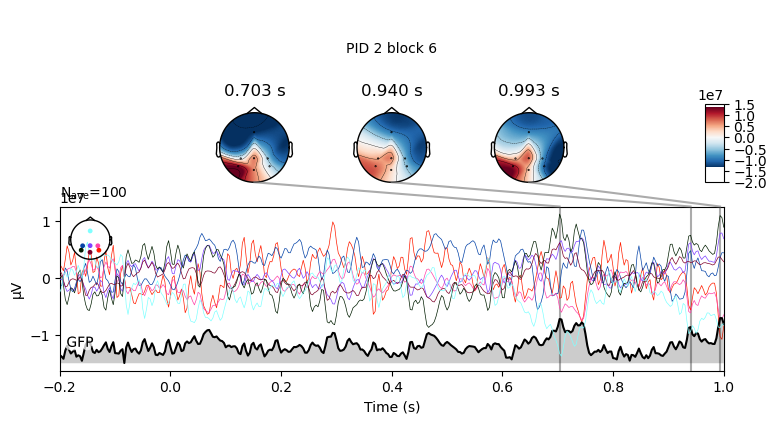

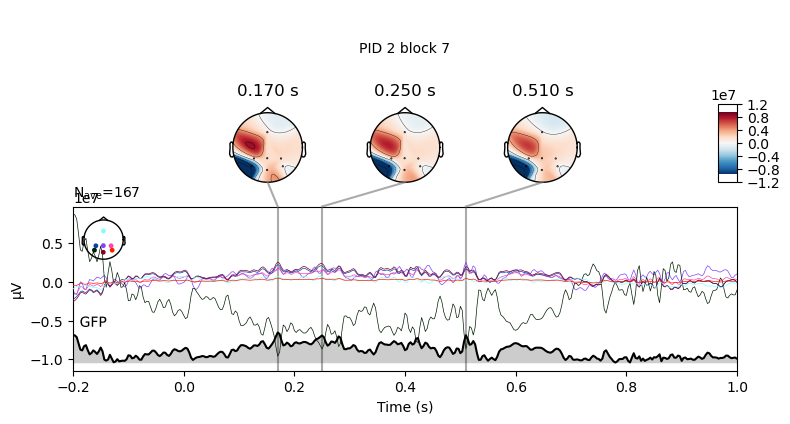

 12%|█▏        | 2/17 [00:08<01:00,  4.05s/it]

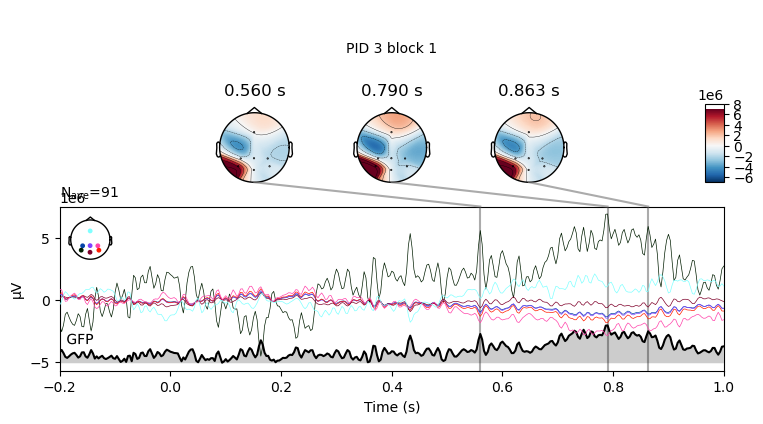

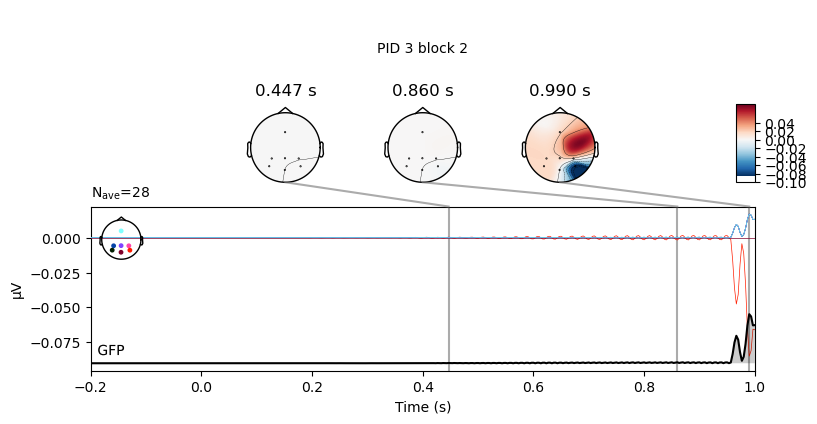

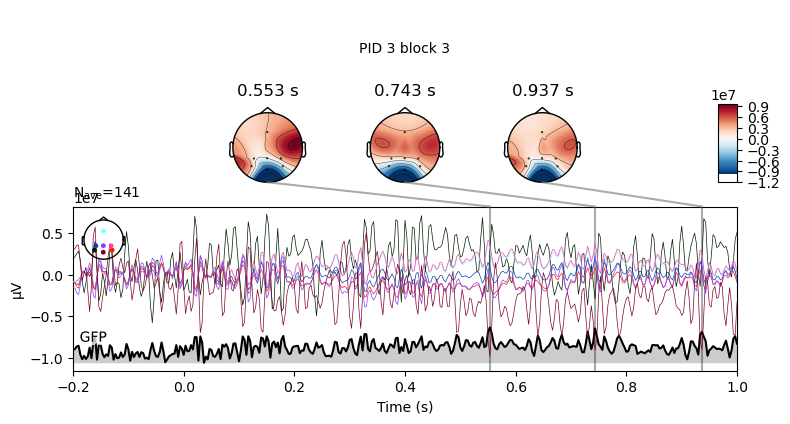

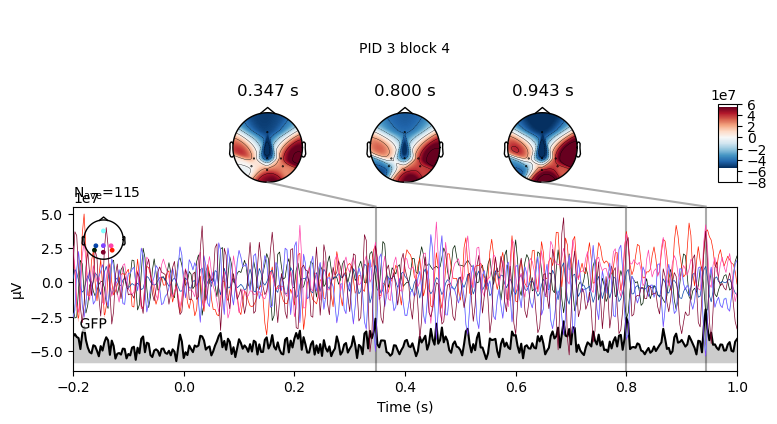

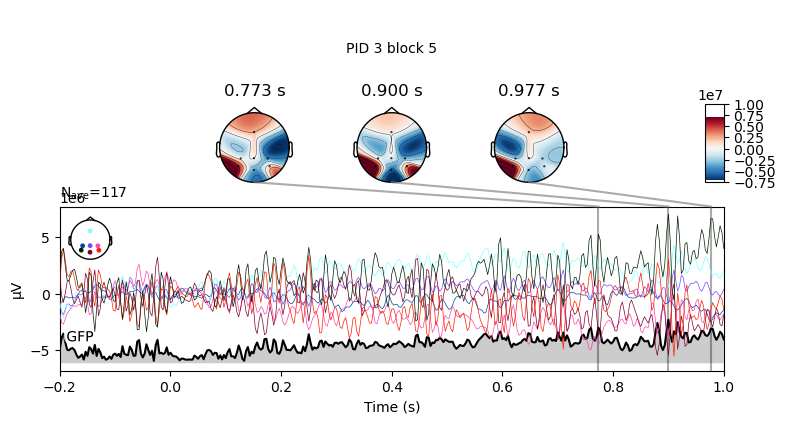

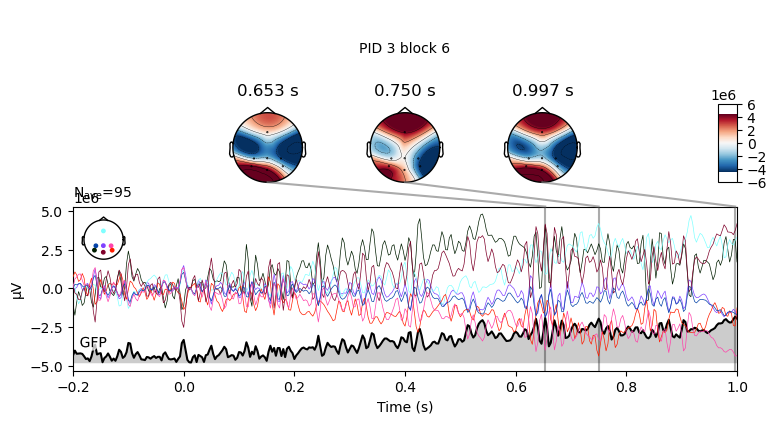

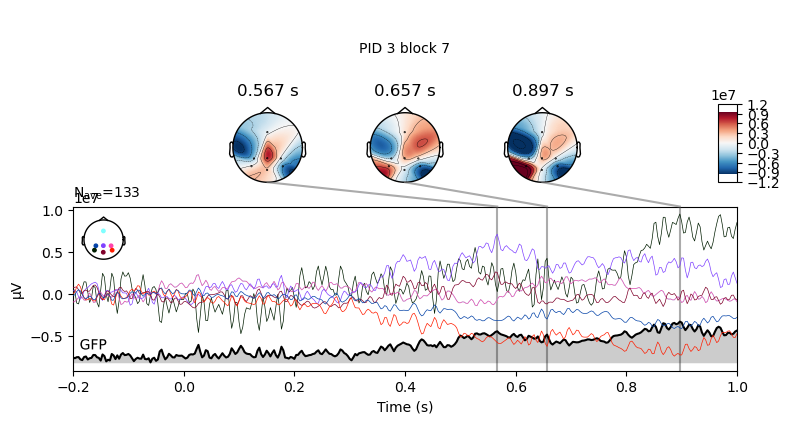

 18%|█▊        | 3/17 [00:12<00:56,  4.03s/it]

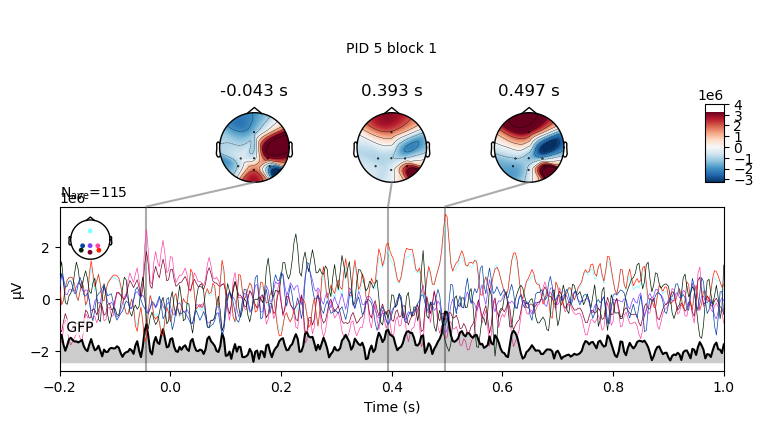

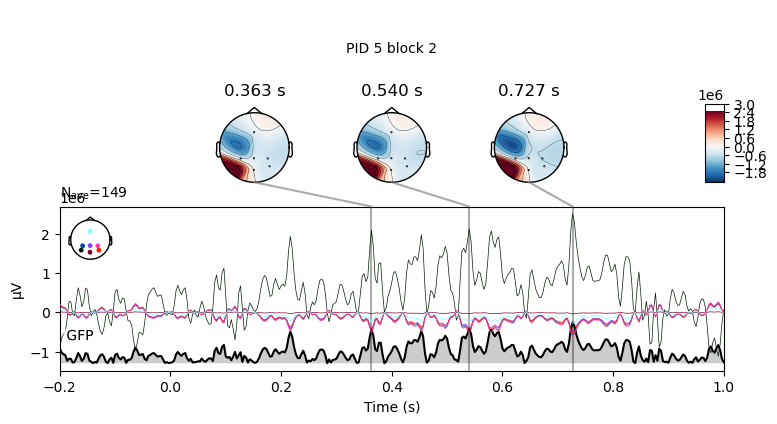

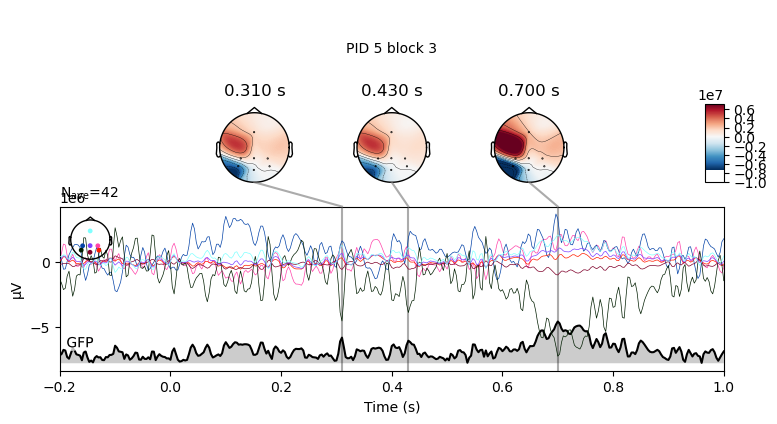

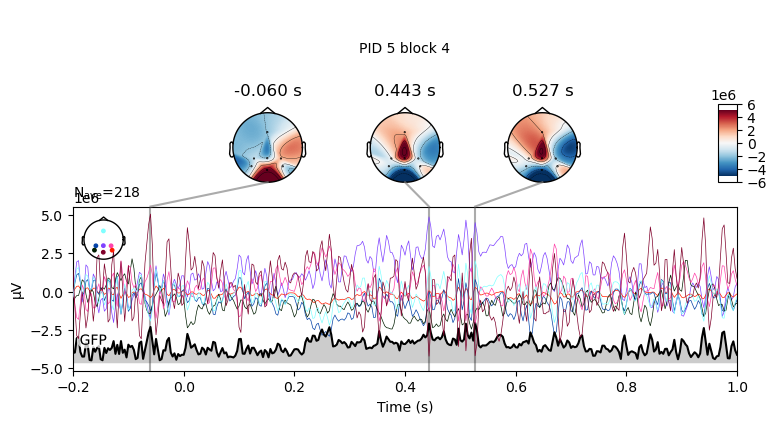

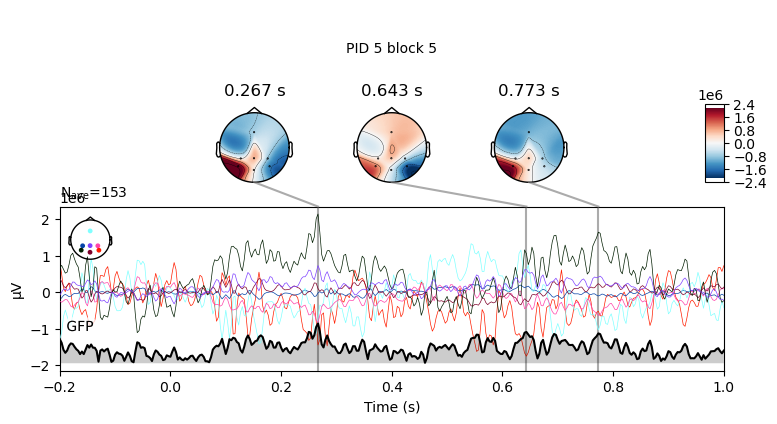

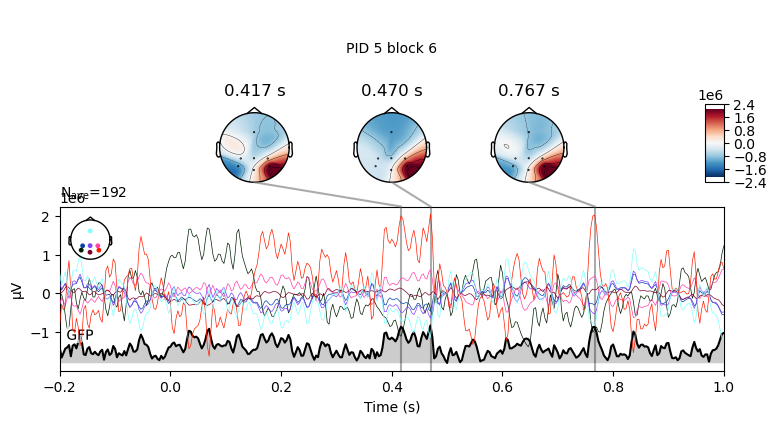

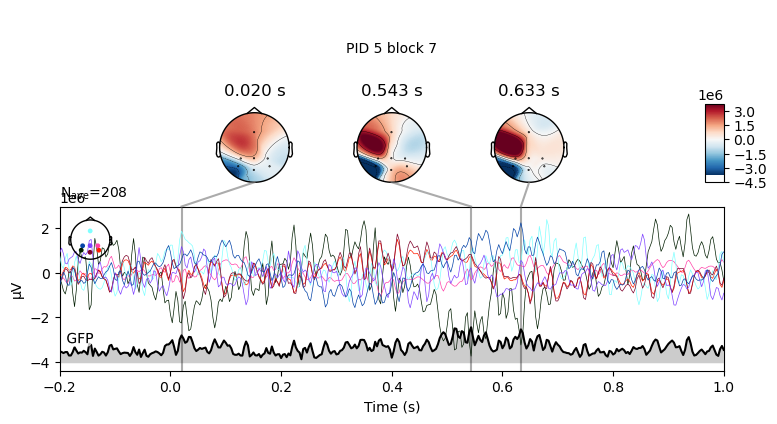

 24%|██▎       | 4/17 [00:15<00:51,  3.95s/it]

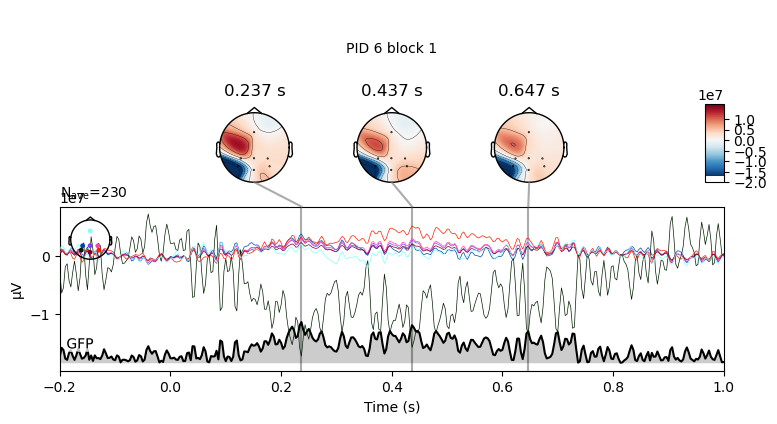

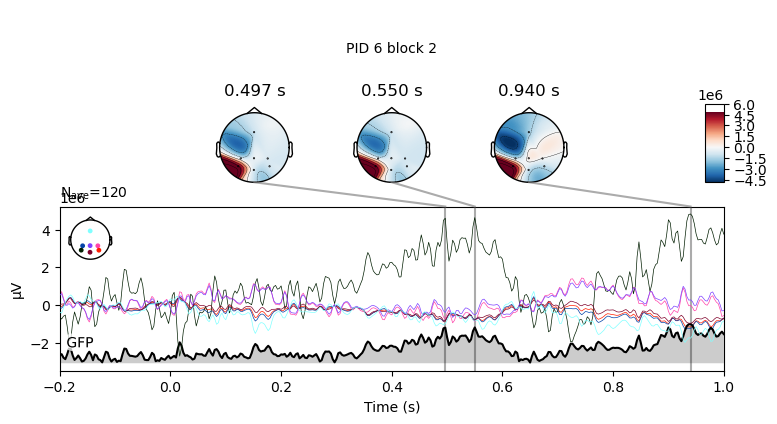

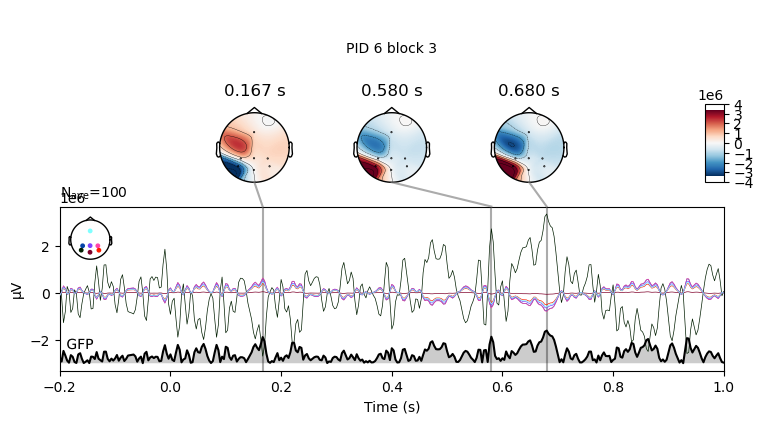

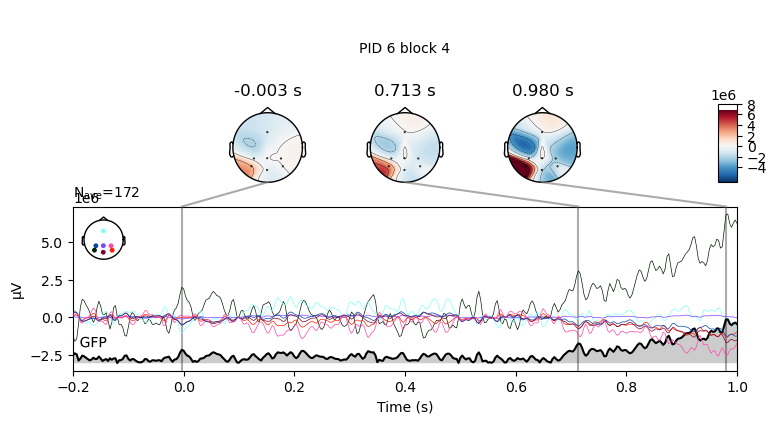

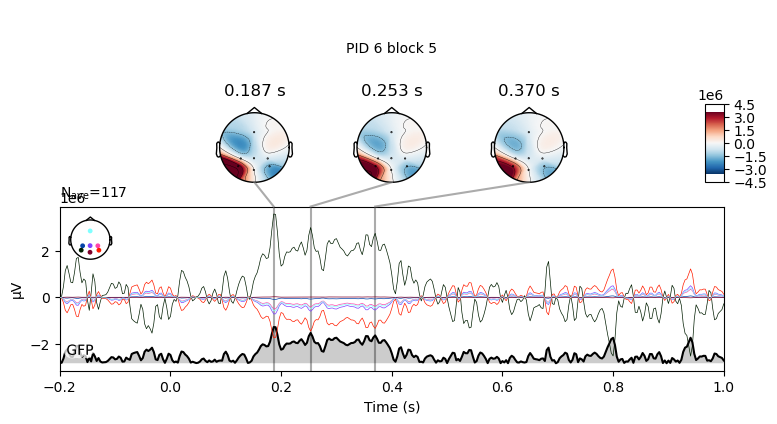

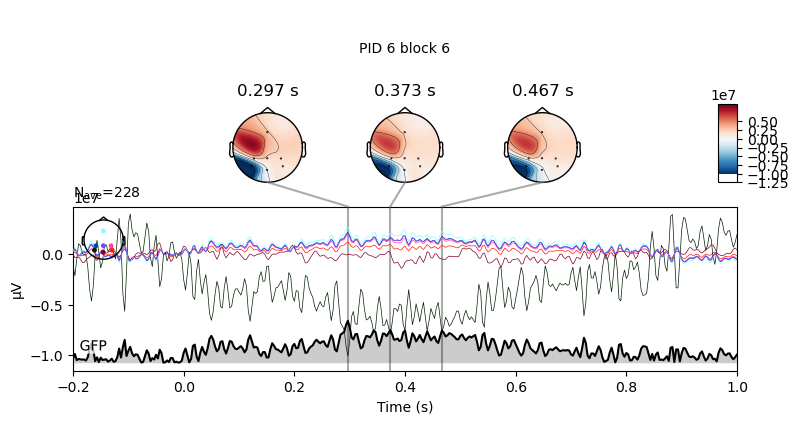

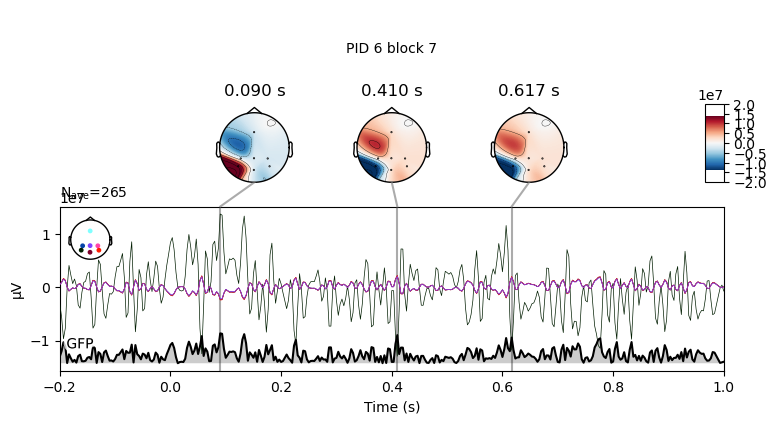

 29%|██▉       | 5/17 [00:19<00:47,  3.95s/it]

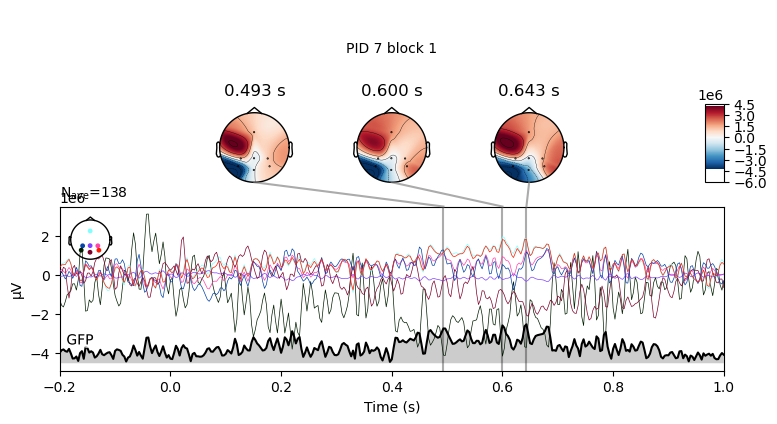

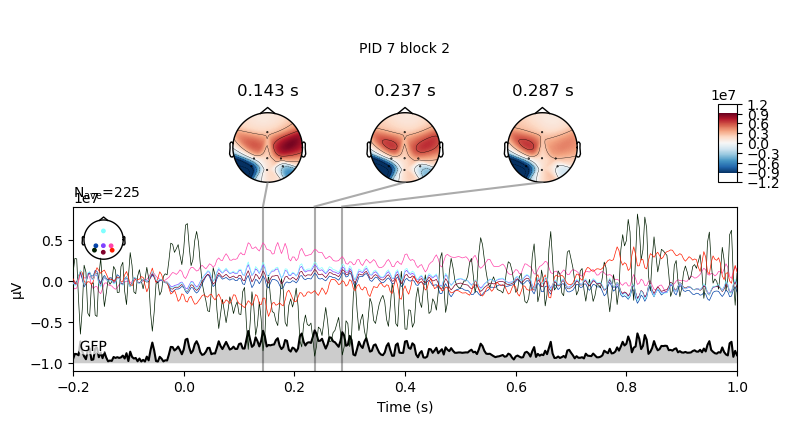

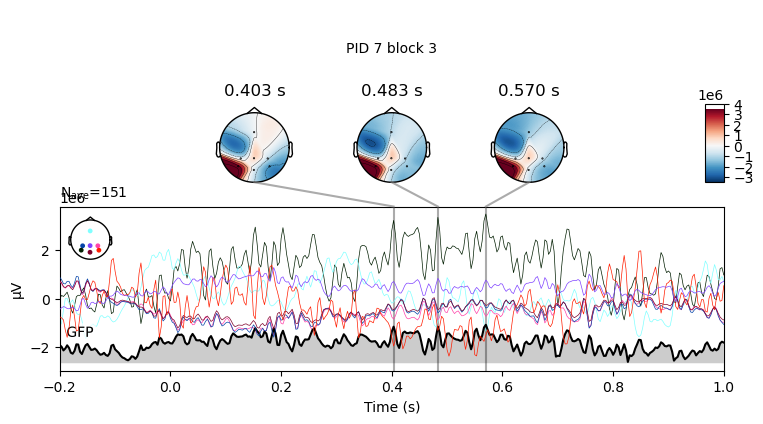

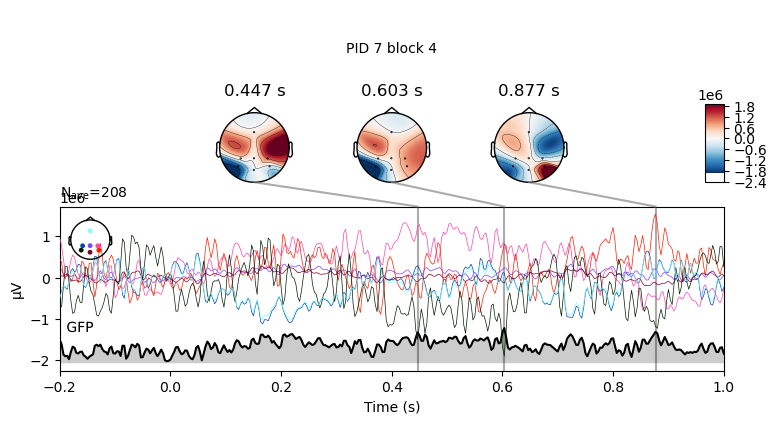

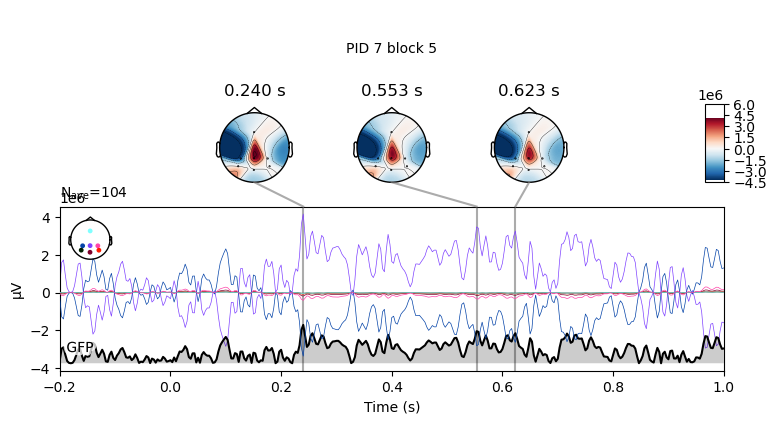

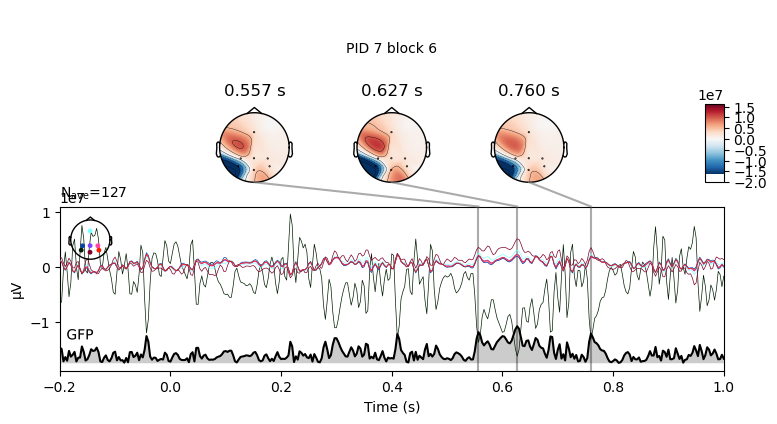

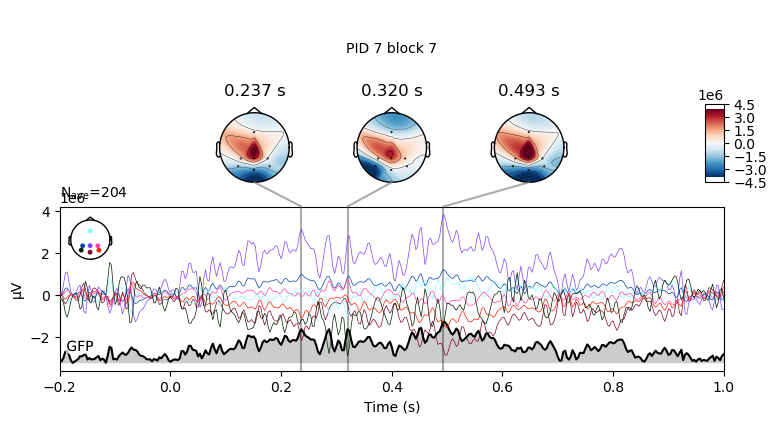

 35%|███▌      | 6/17 [00:23<00:43,  3.95s/it]

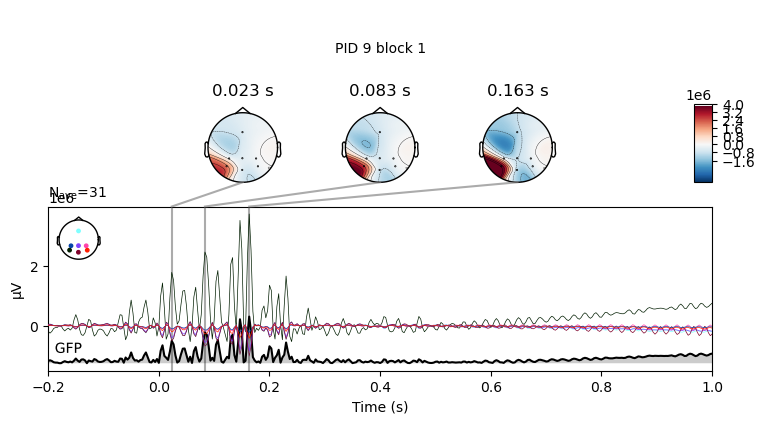

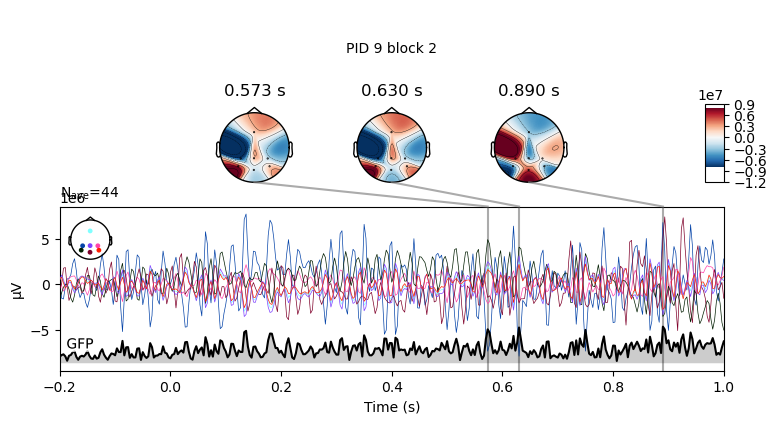

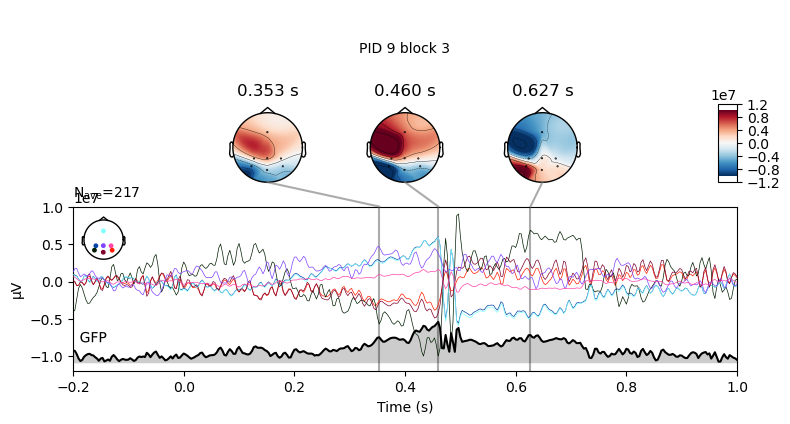

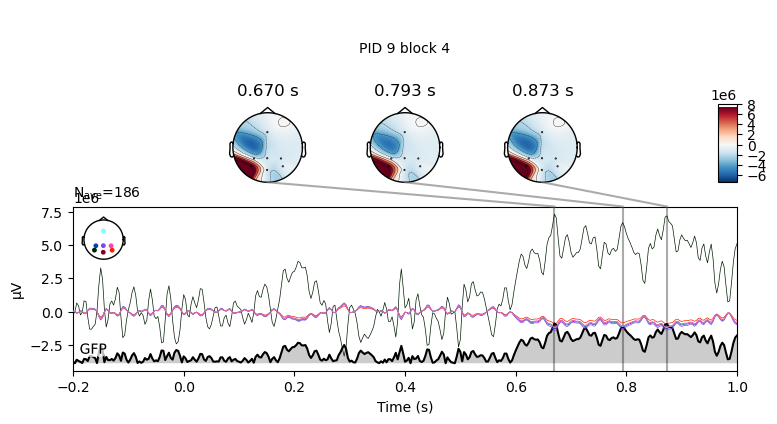

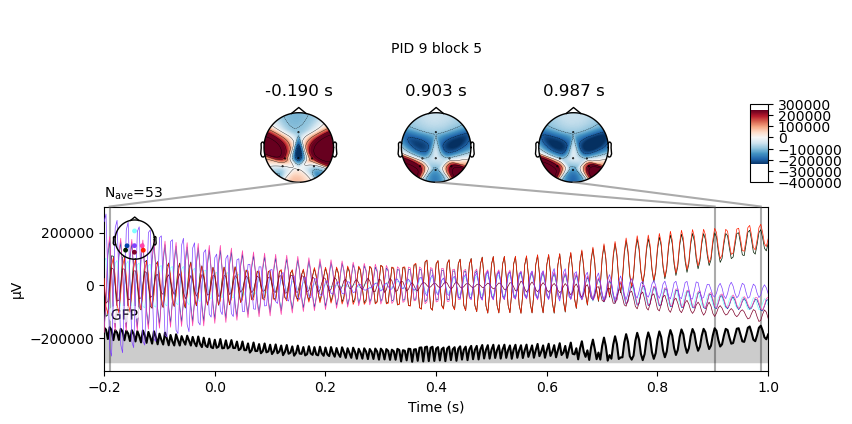

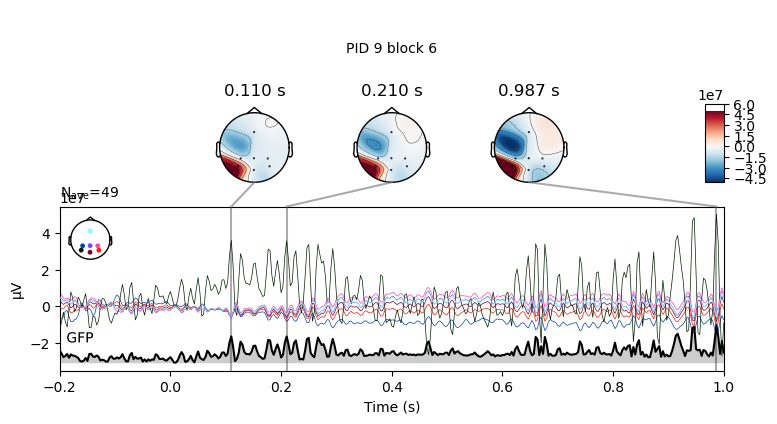

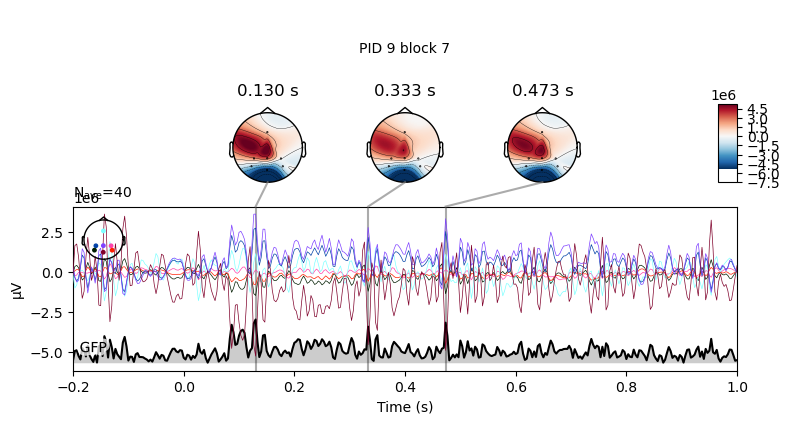

 41%|████      | 7/17 [00:27<00:39,  3.98s/it]

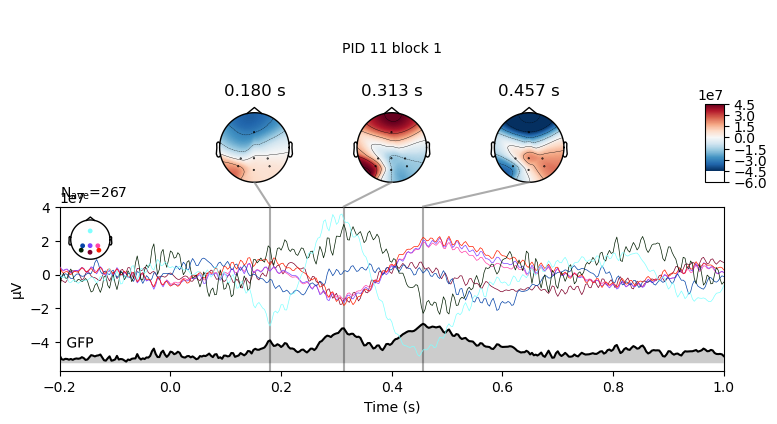

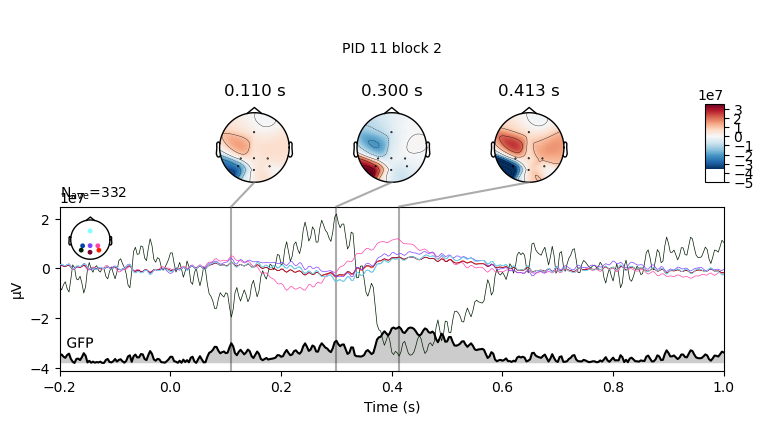

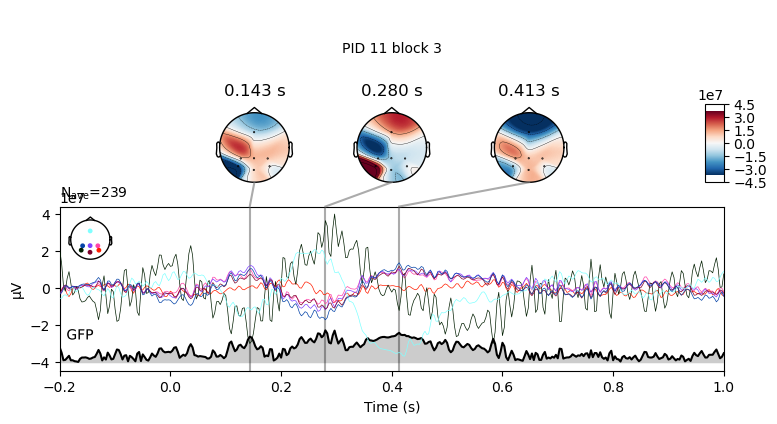

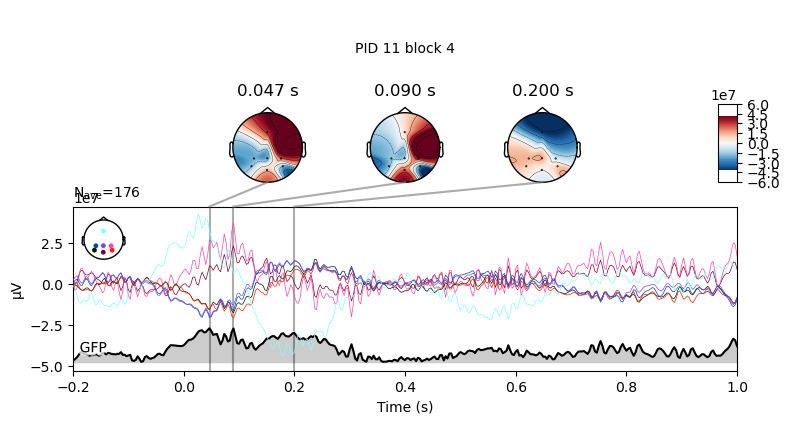

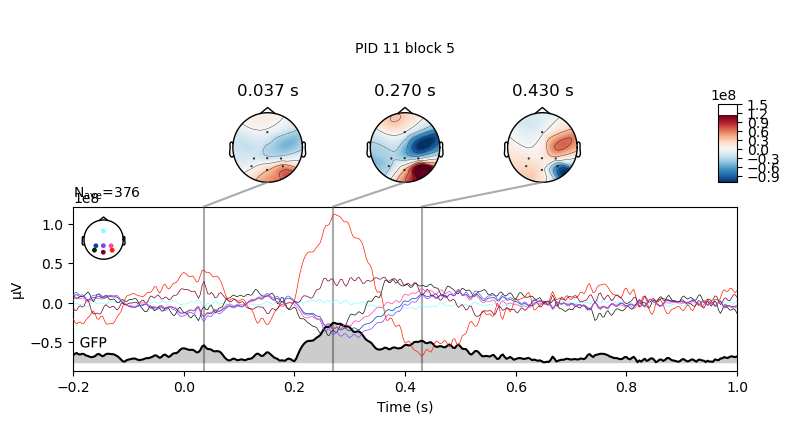

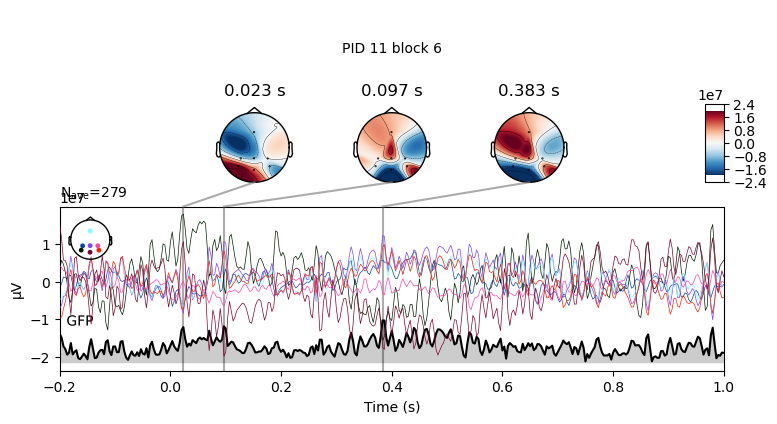

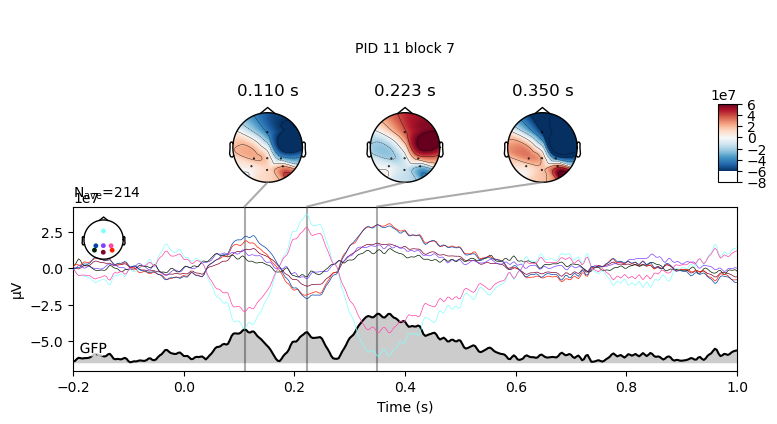

 47%|████▋     | 8/17 [00:31<00:35,  3.96s/it]

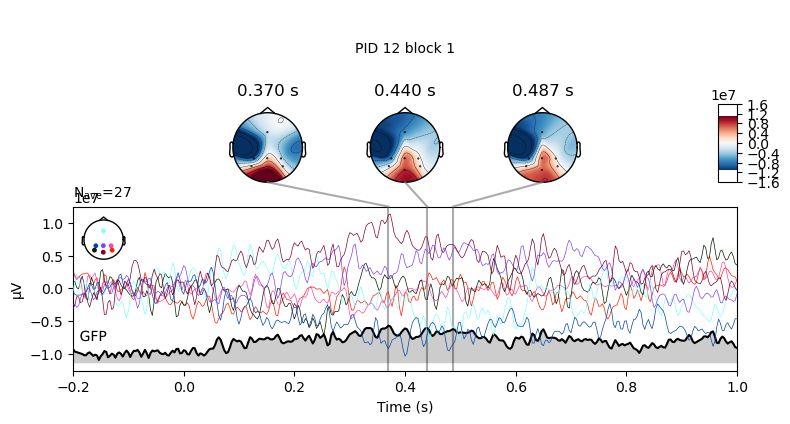

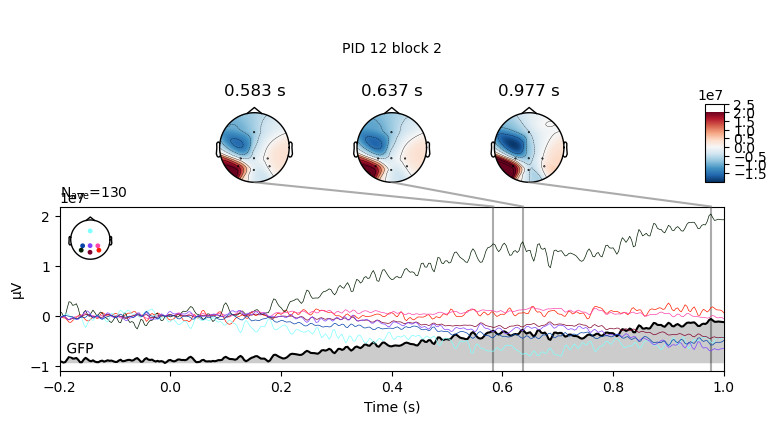

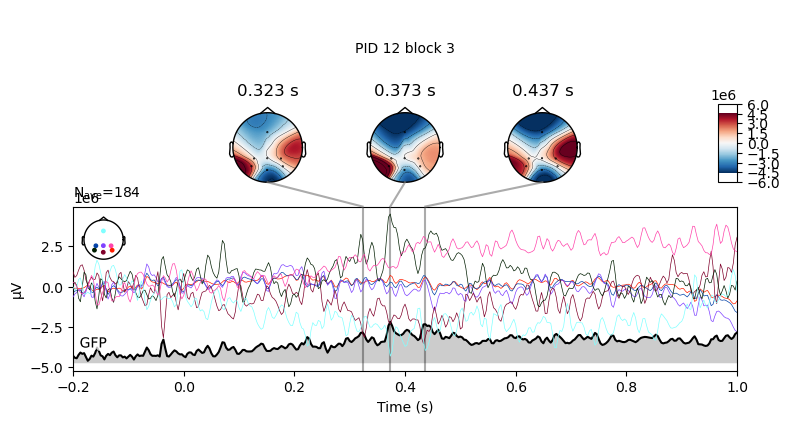

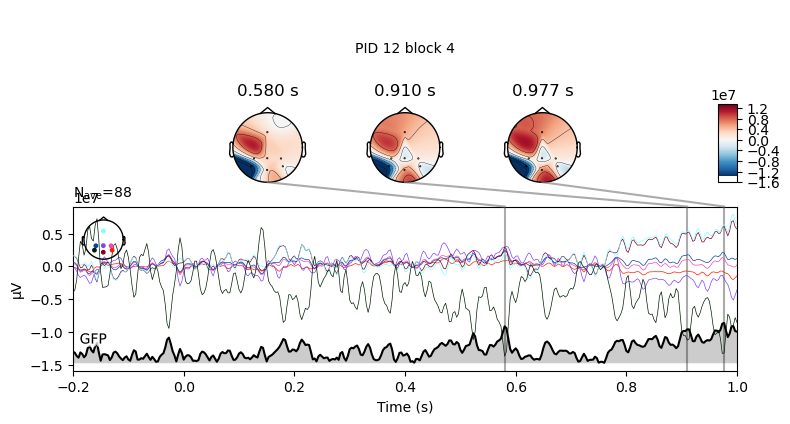

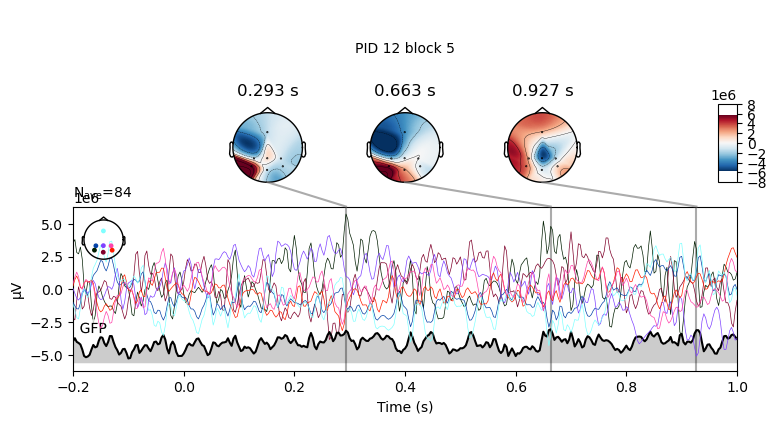

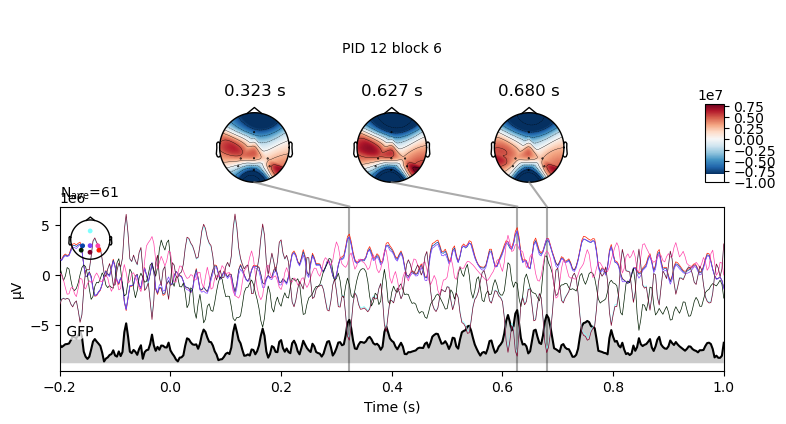

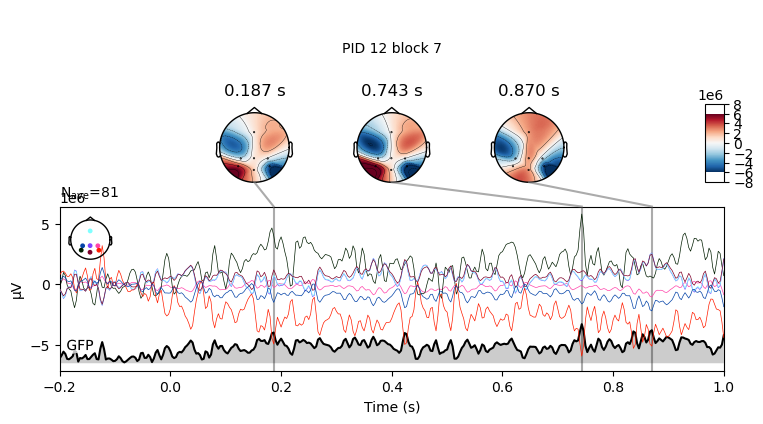

 53%|█████▎    | 9/17 [00:35<00:32,  4.01s/it]

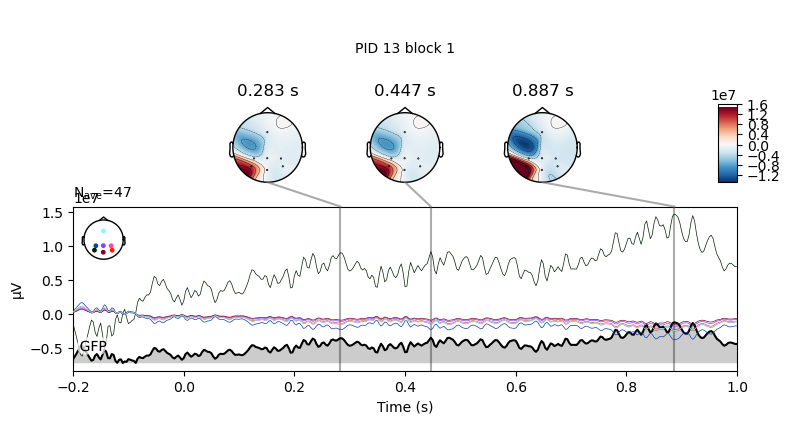

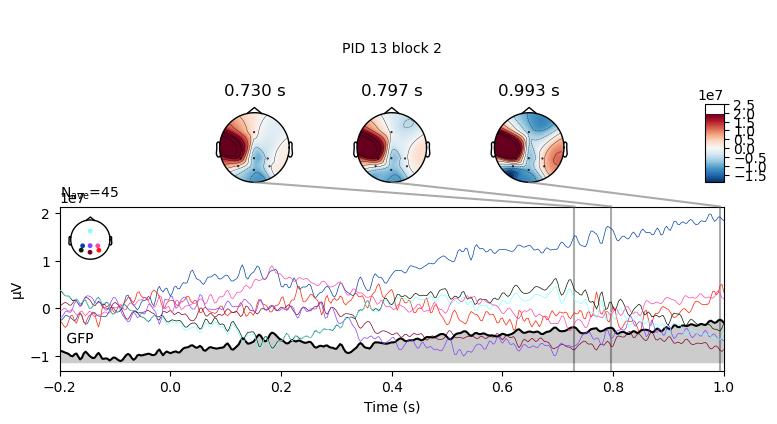

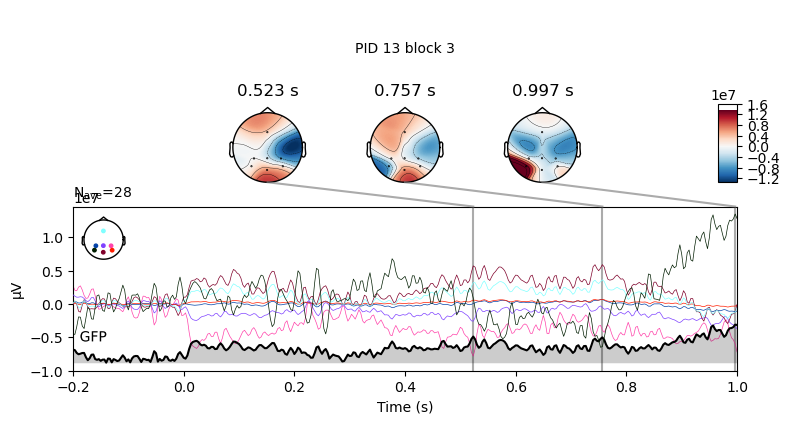

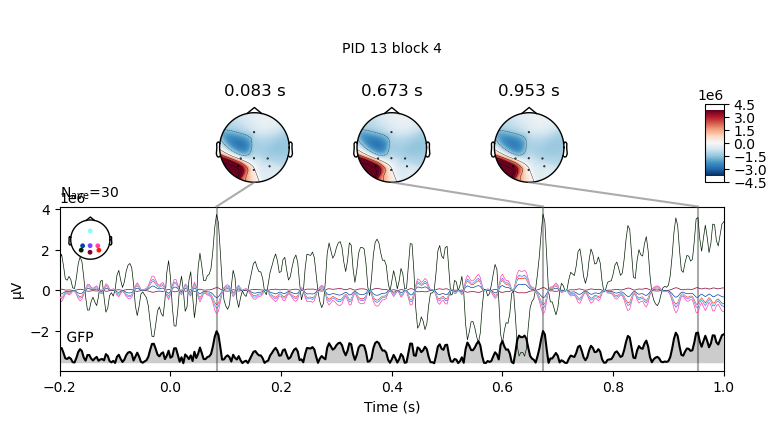

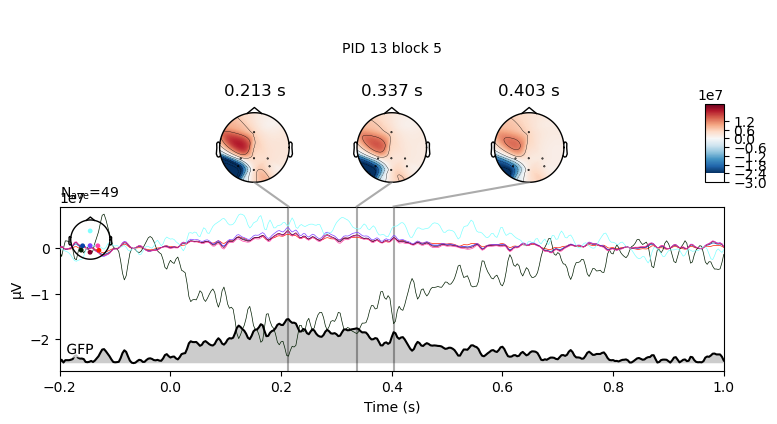

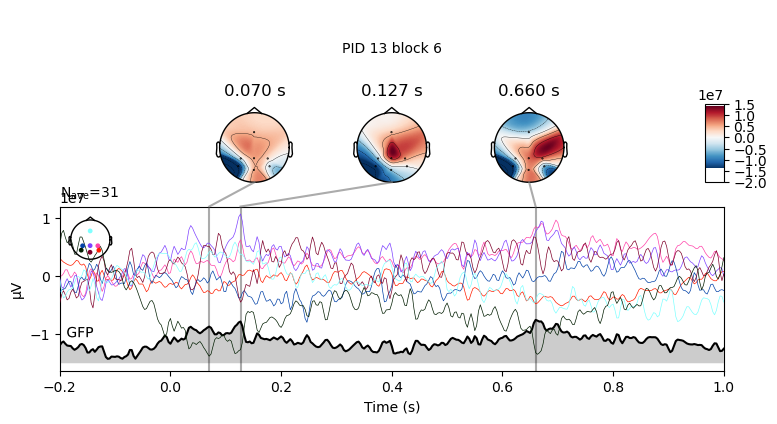

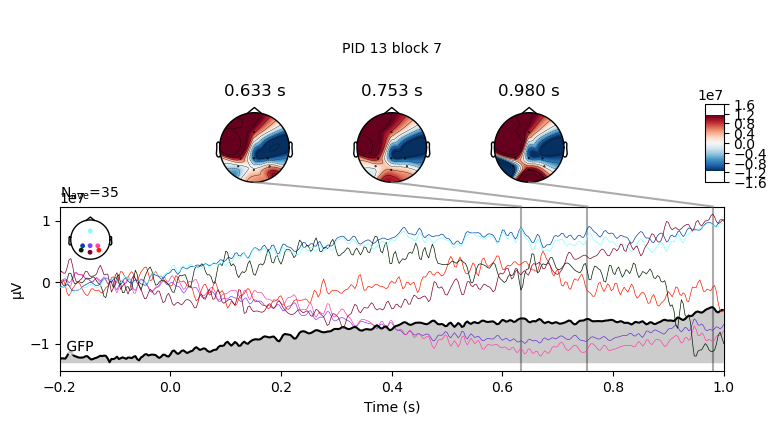

 59%|█████▉    | 10/17 [00:40<00:28,  4.07s/it]

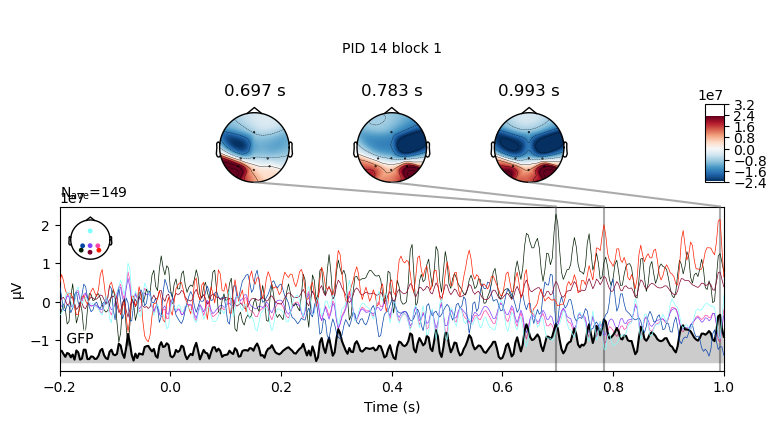

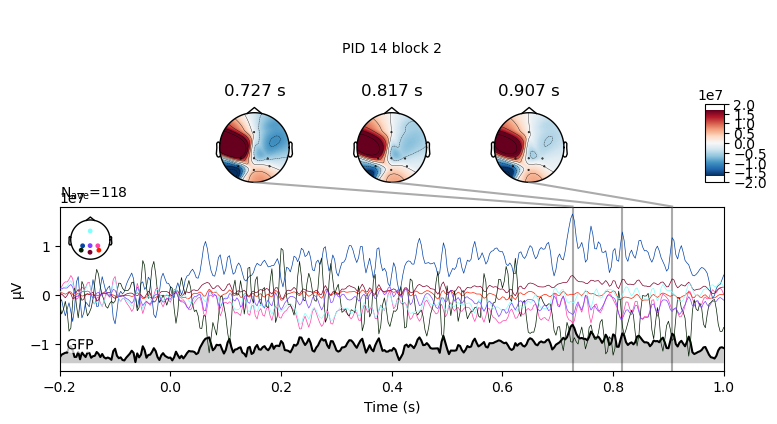

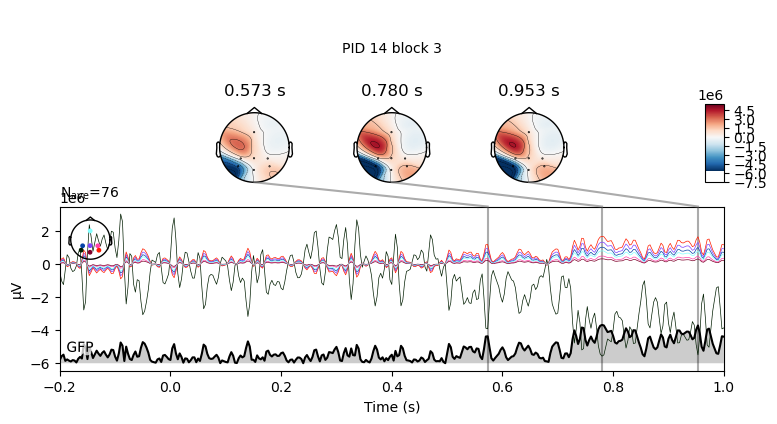

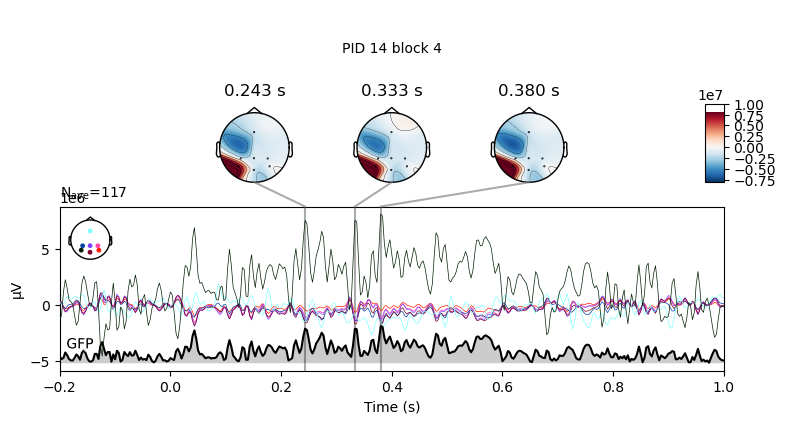

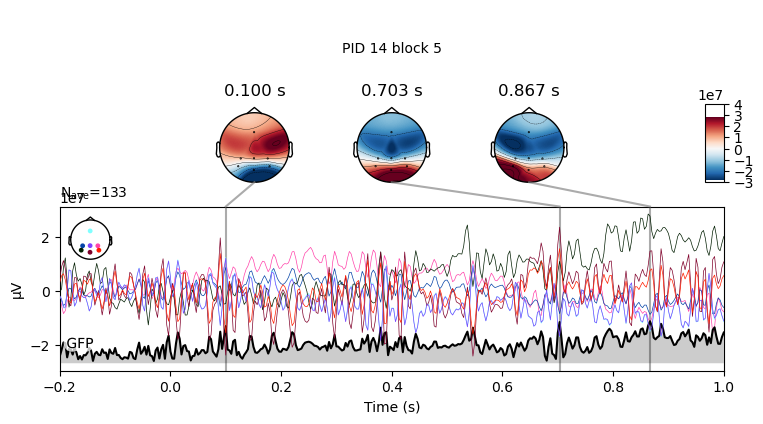

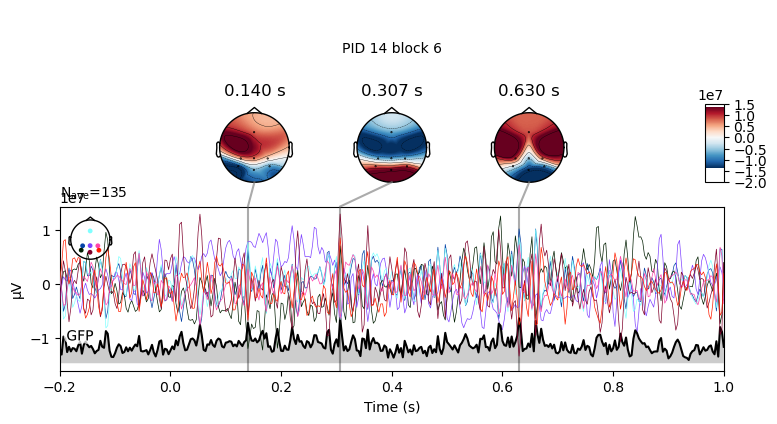

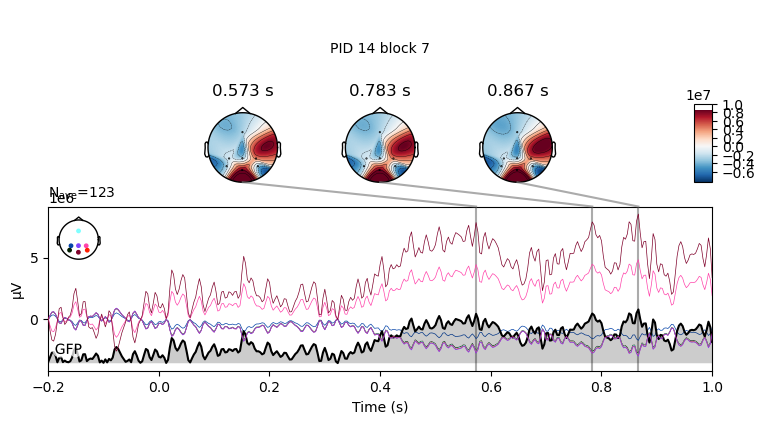

 65%|██████▍   | 11/17 [00:44<00:24,  4.16s/it]

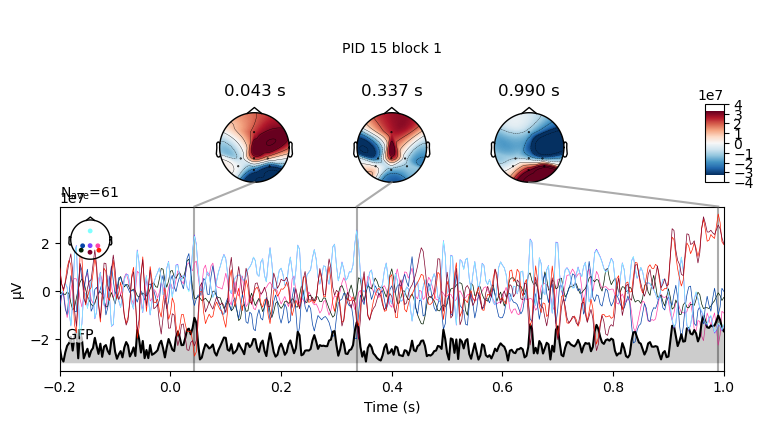

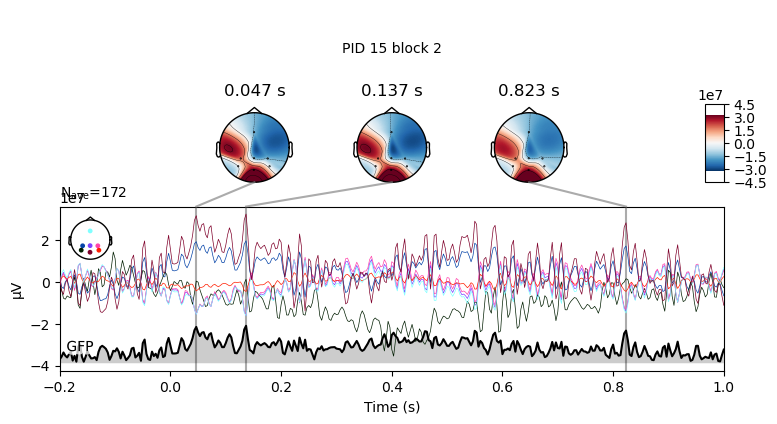

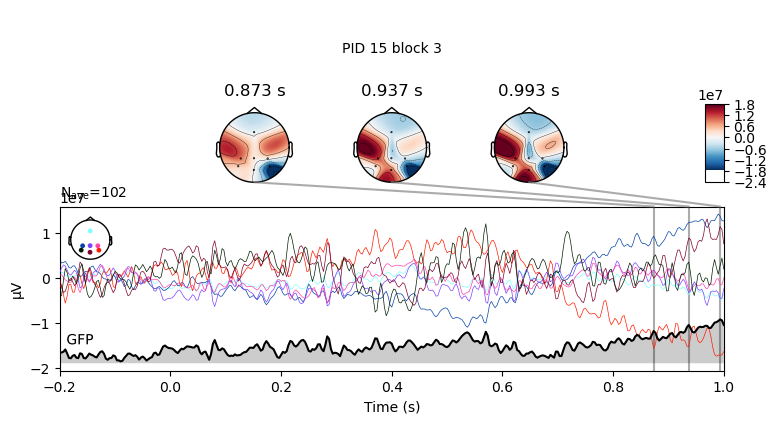

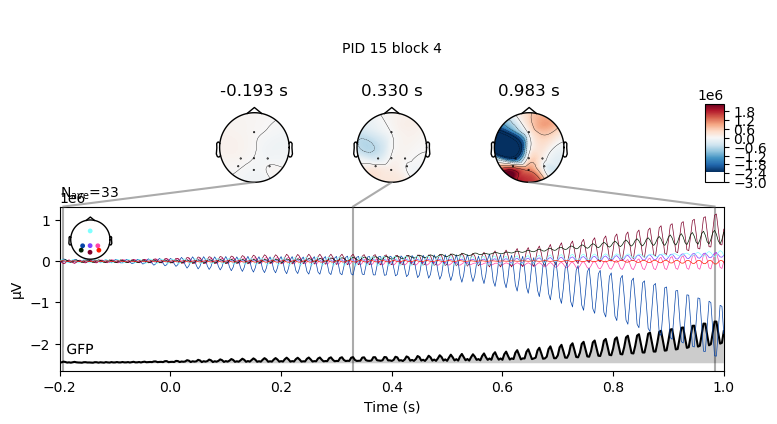

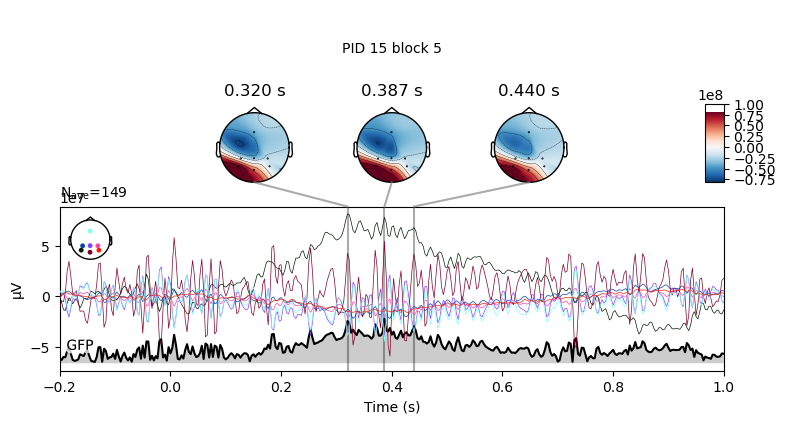

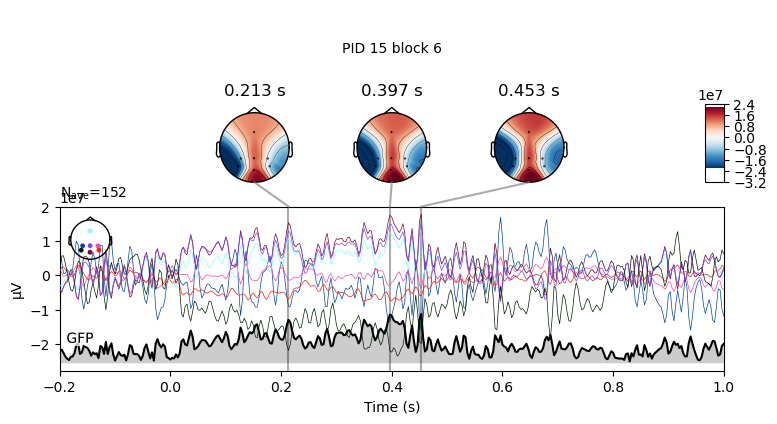

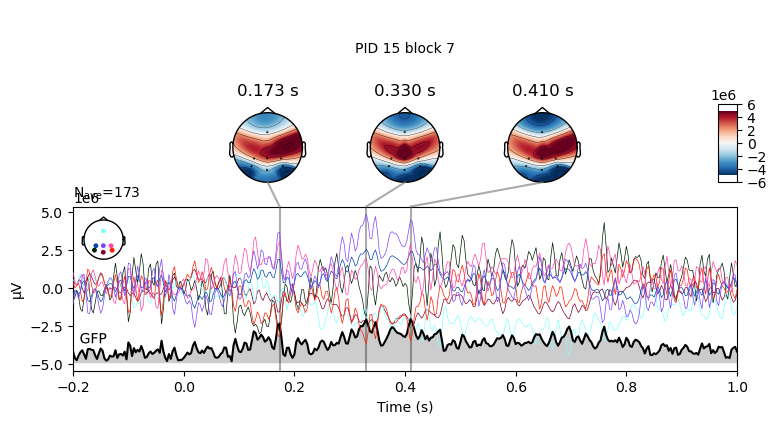

 71%|███████   | 12/17 [00:48<00:20,  4.08s/it]

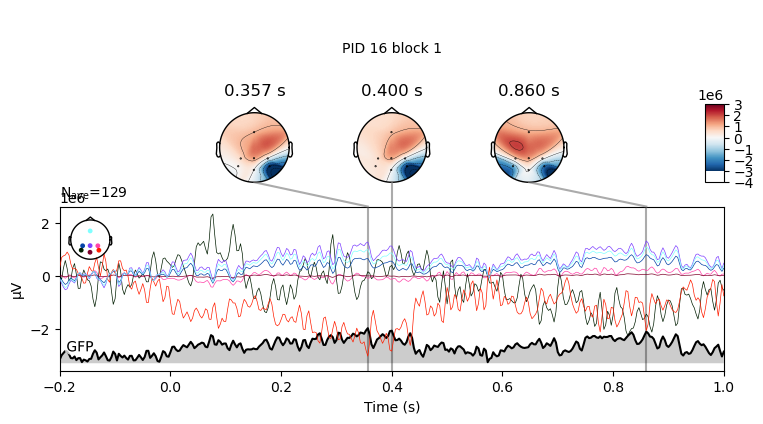

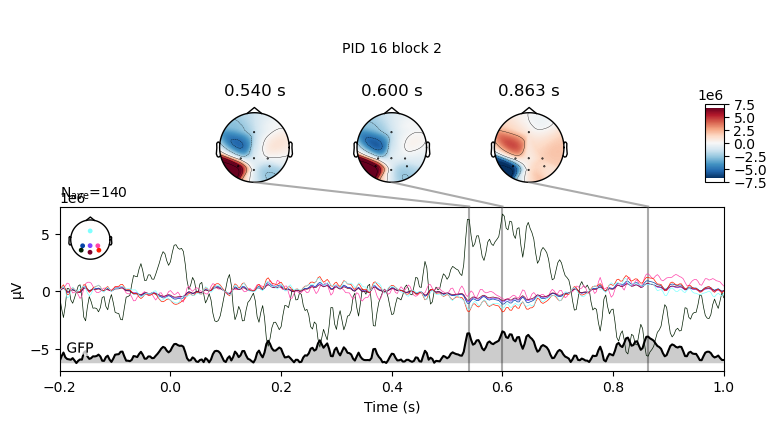

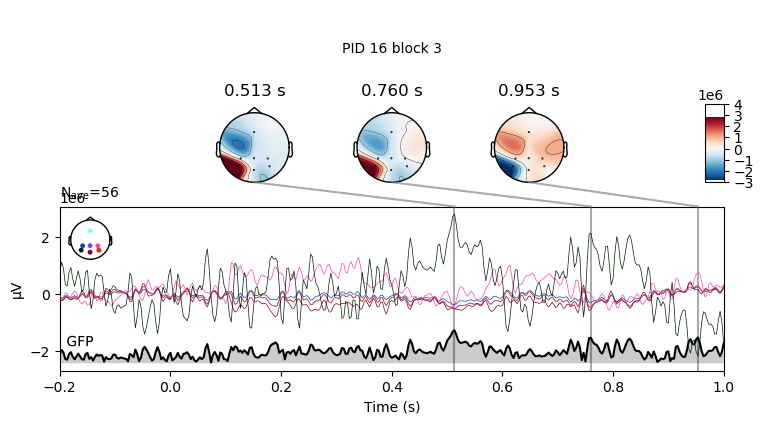

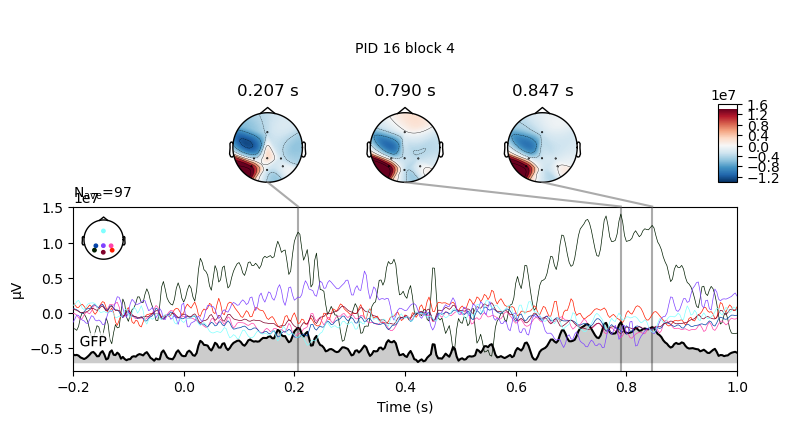

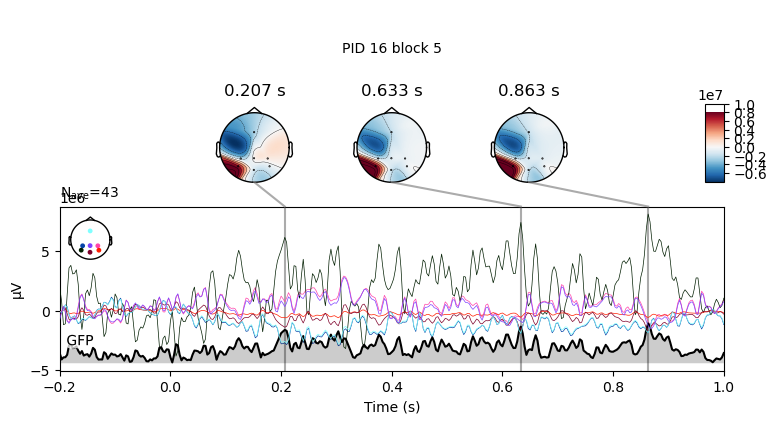

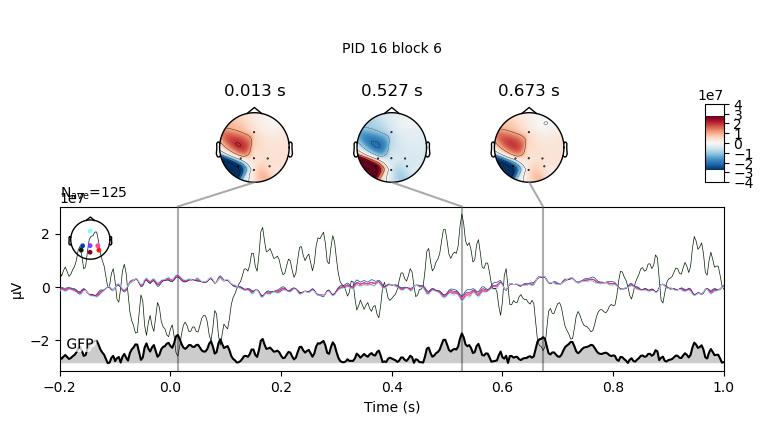

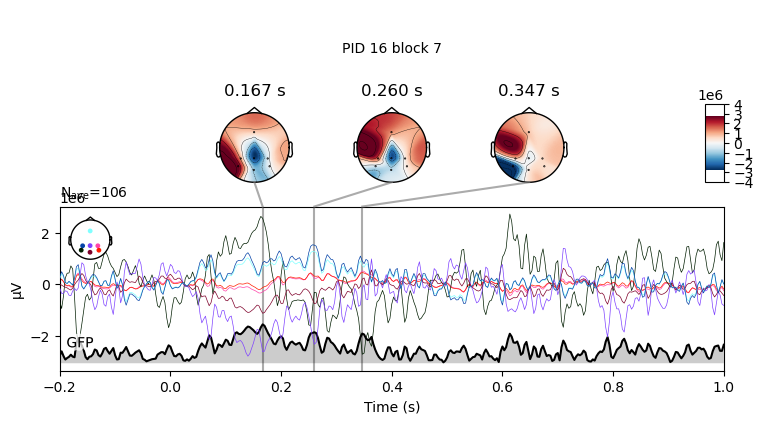

 76%|███████▋  | 13/17 [00:52<00:16,  4.09s/it]

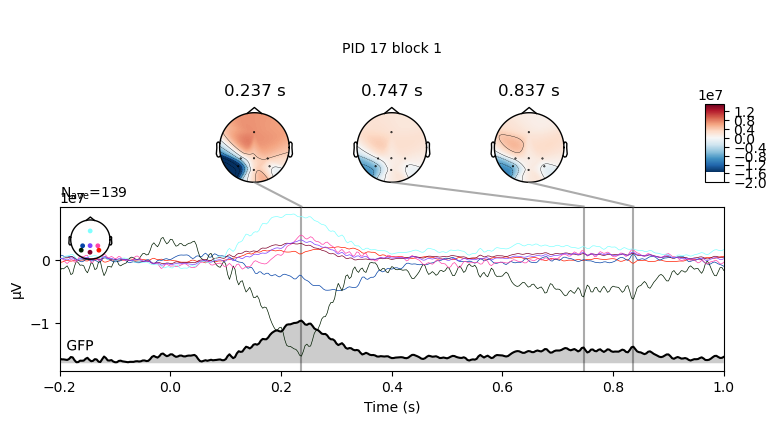

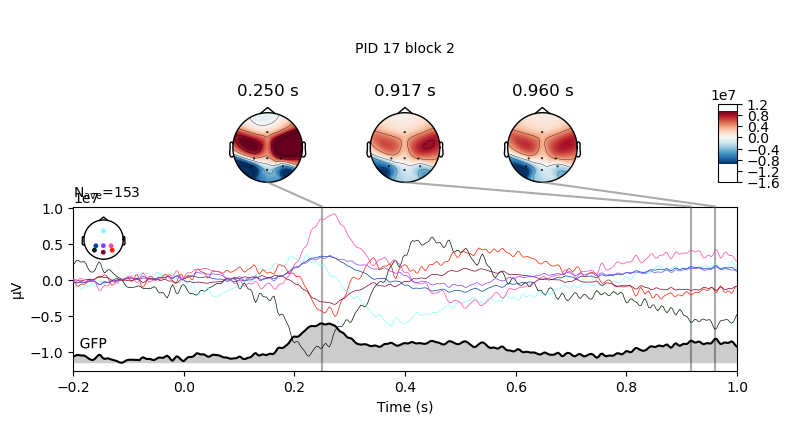

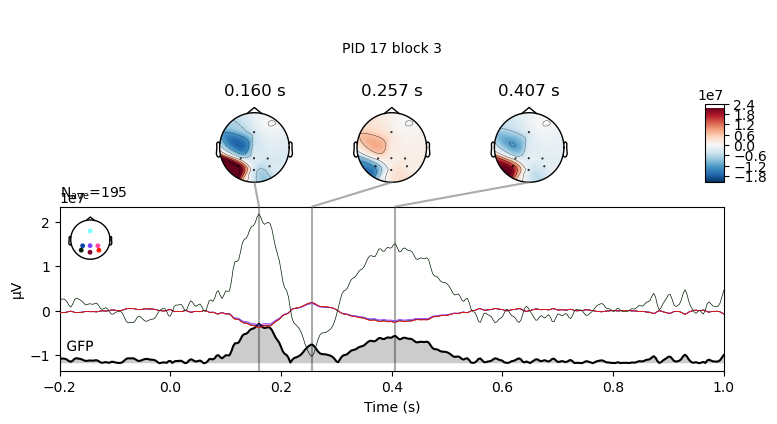

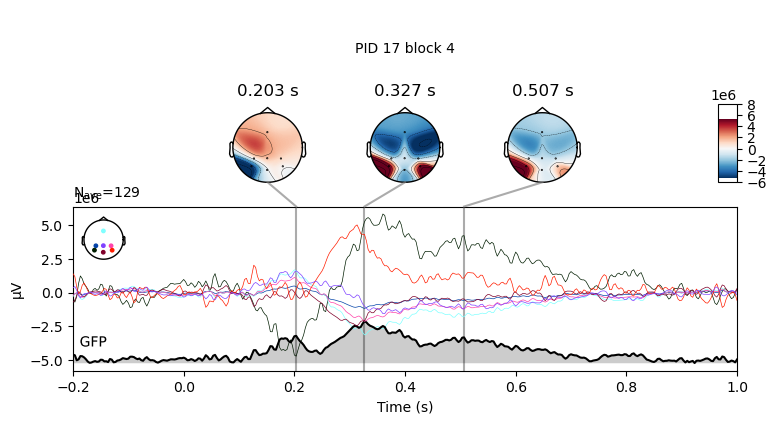

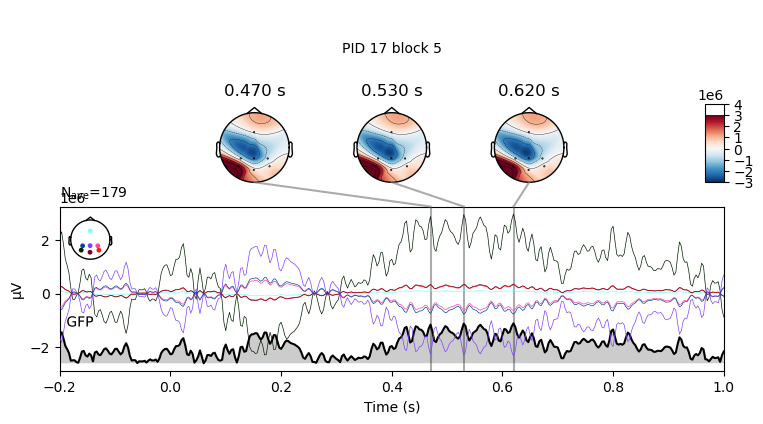

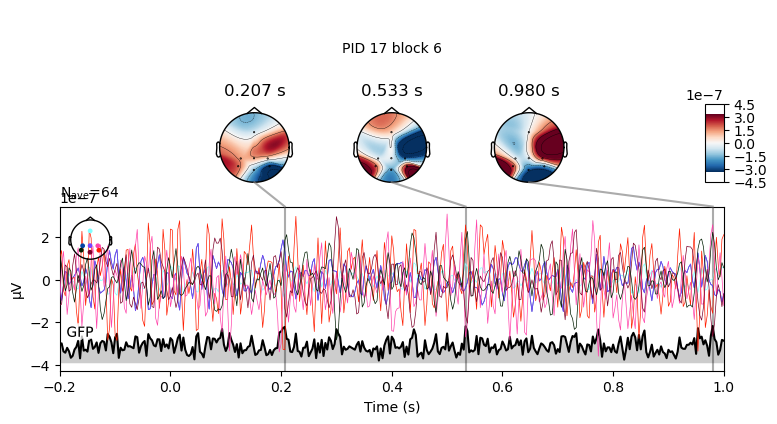

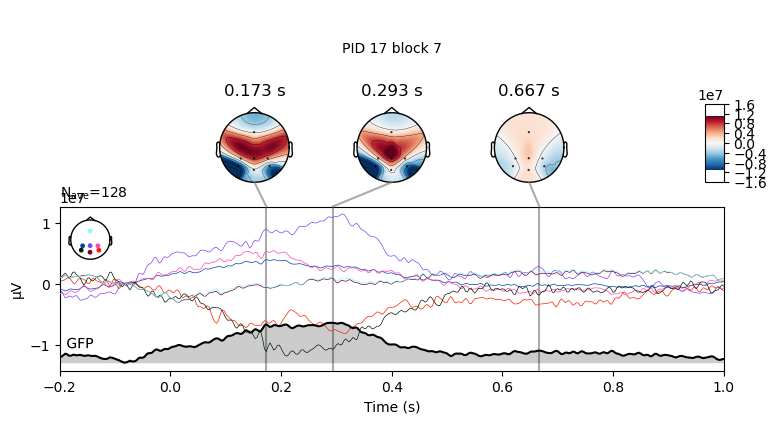

 82%|████████▏ | 14/17 [00:56<00:12,  4.06s/it]

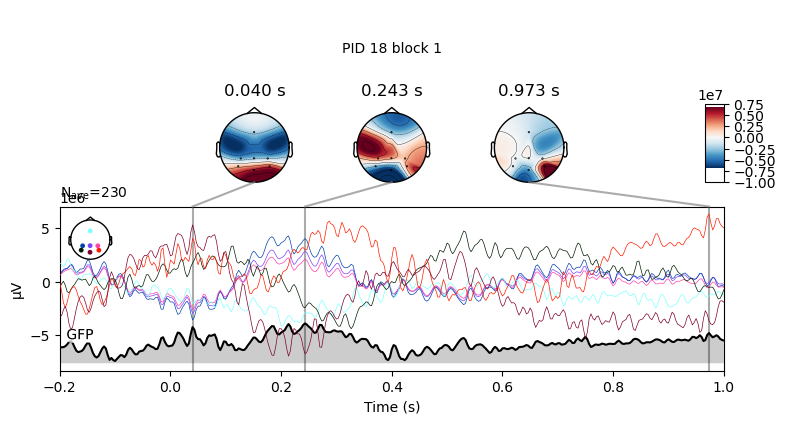

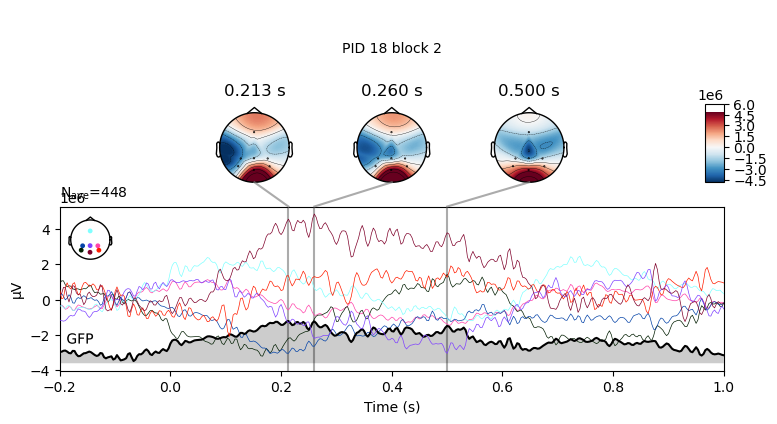

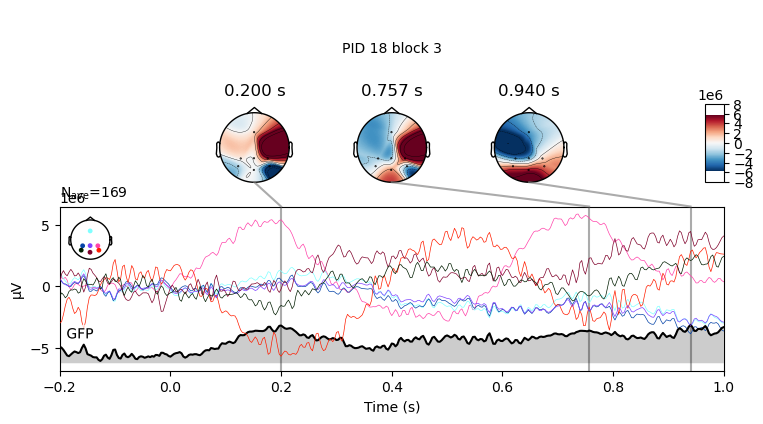

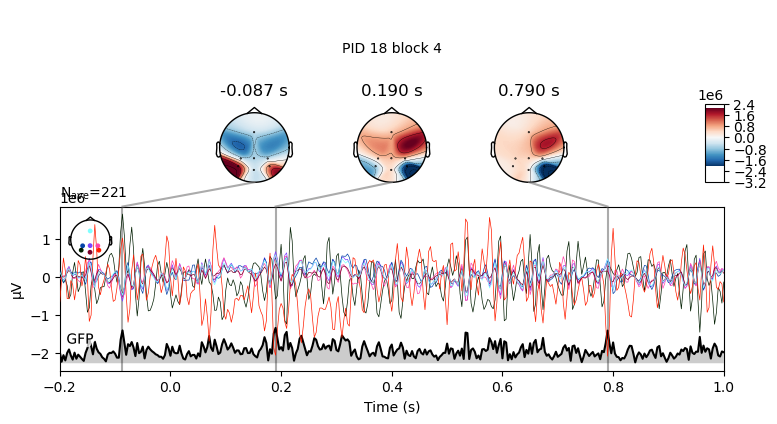

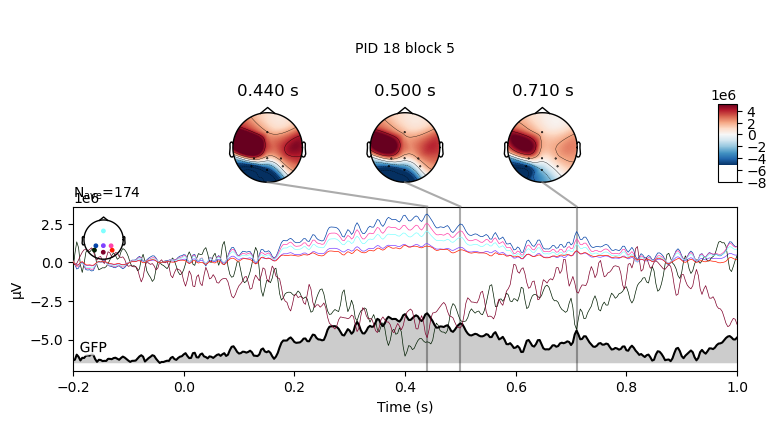

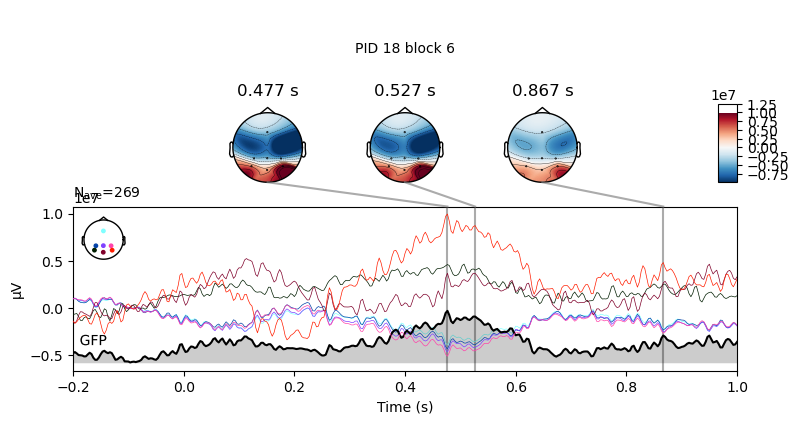

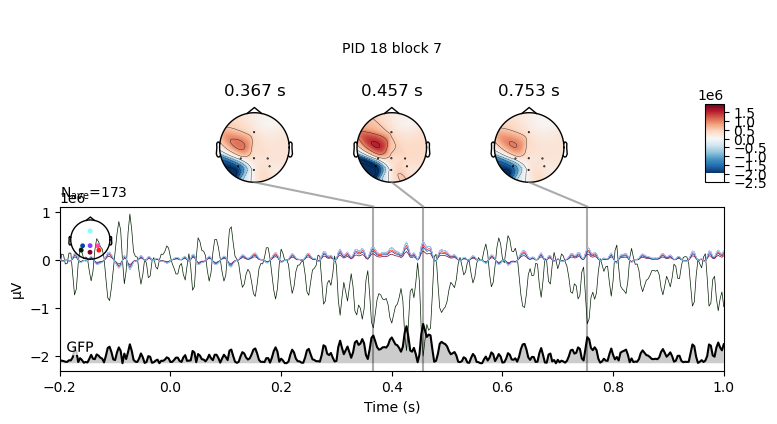

 88%|████████▊ | 15/17 [01:00<00:08,  4.08s/it]

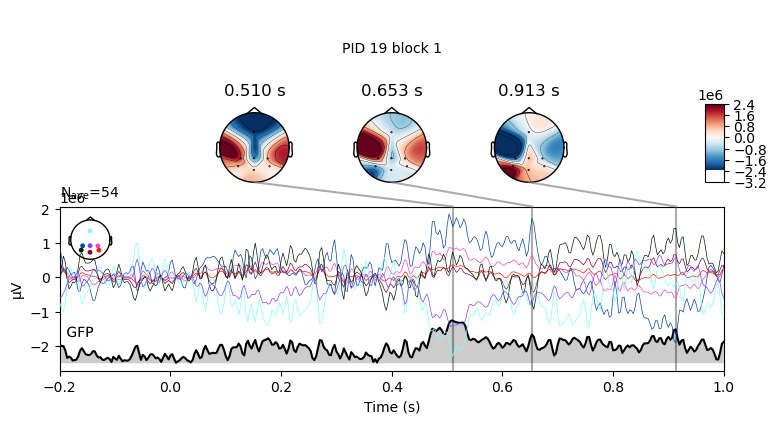

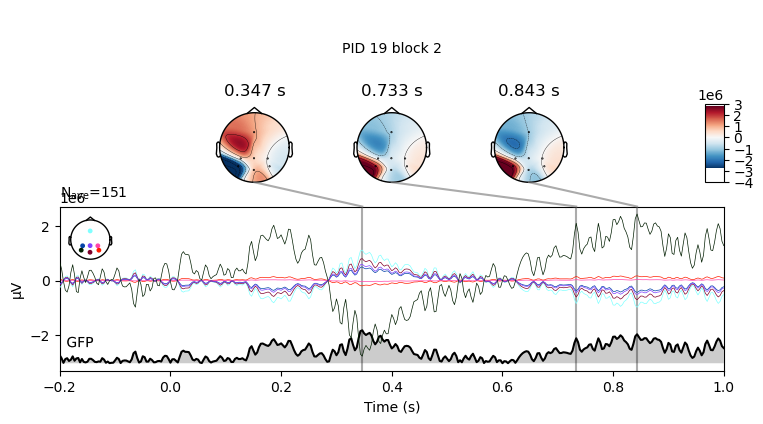

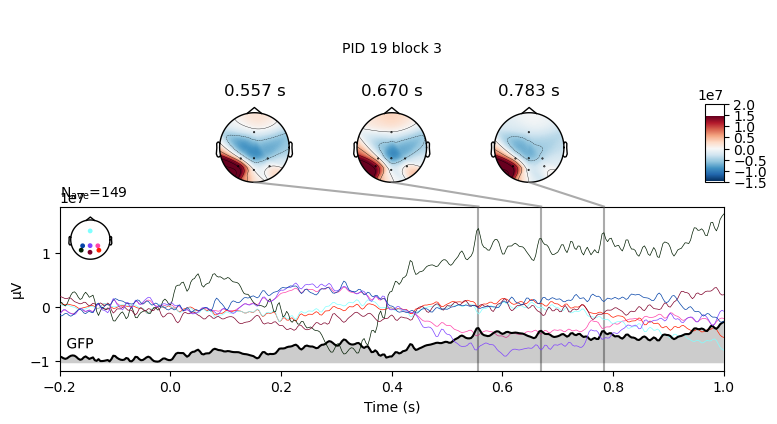

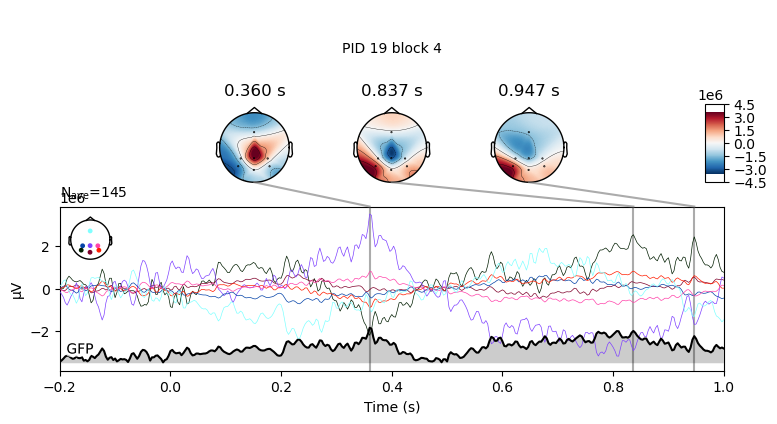

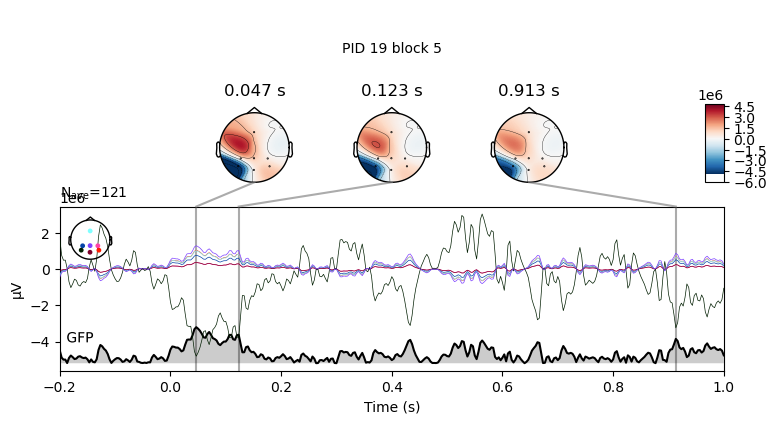

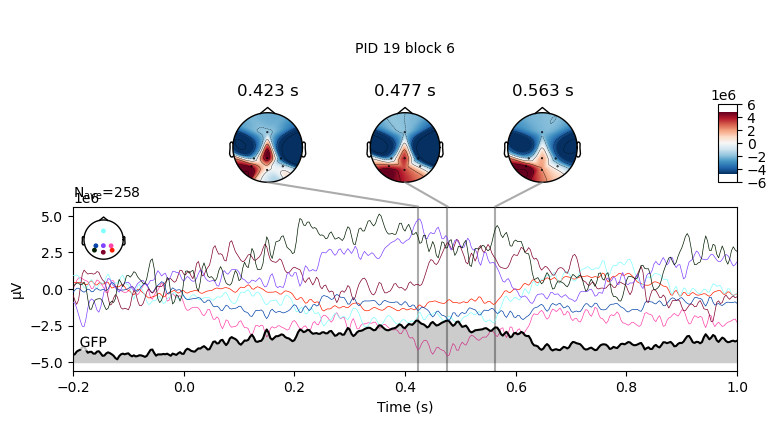

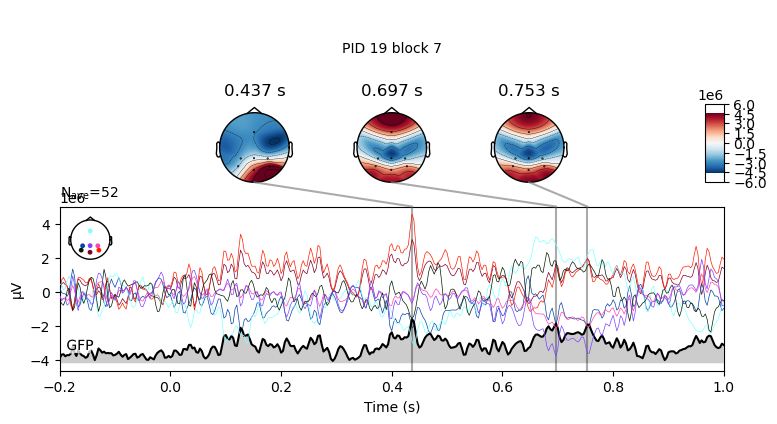

 94%|█████████▍| 16/17 [01:04<00:04,  4.05s/it]

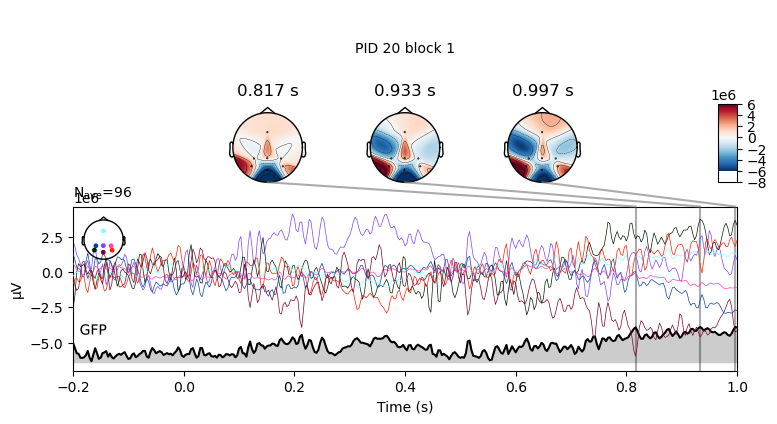

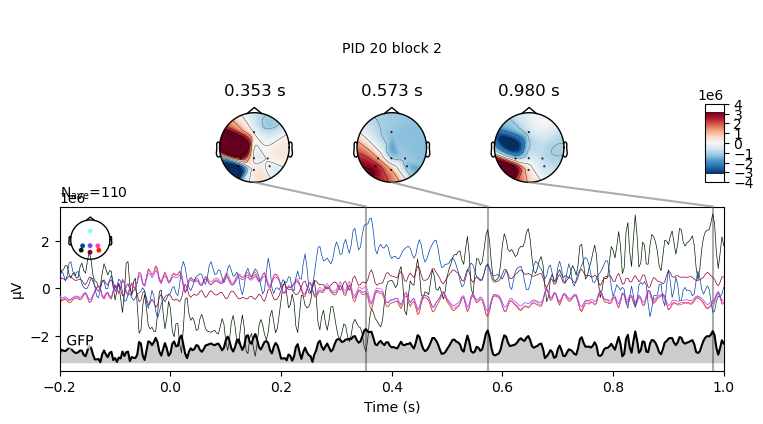

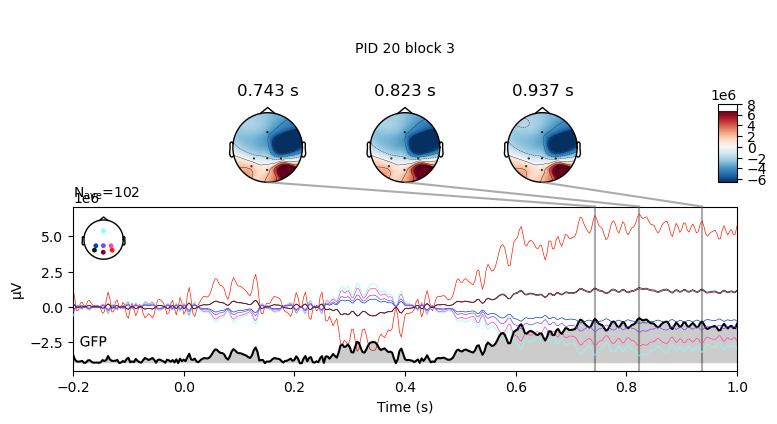

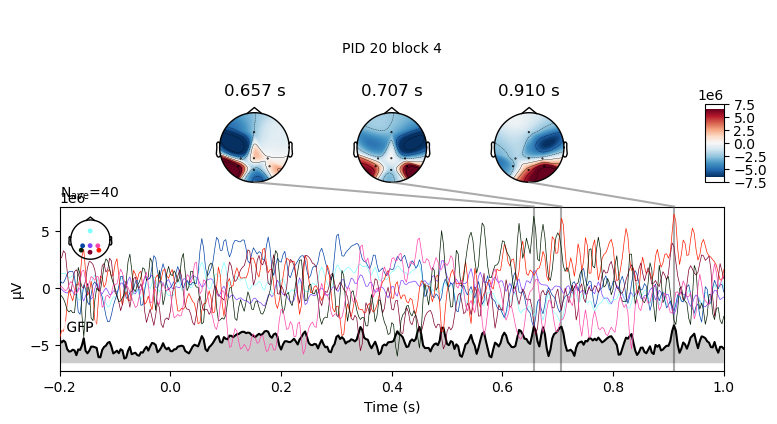

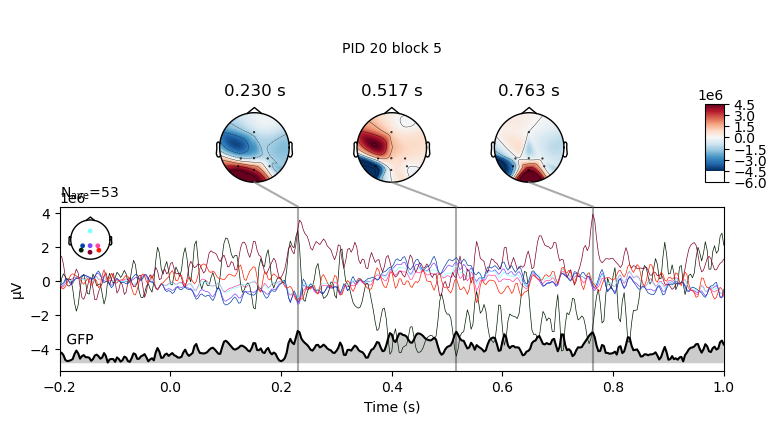

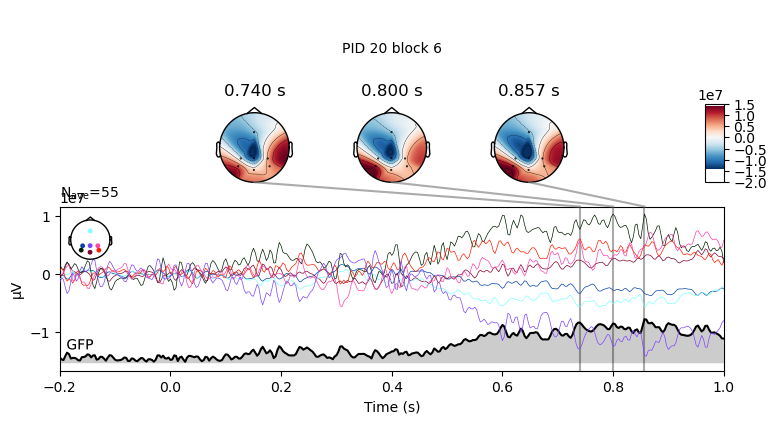

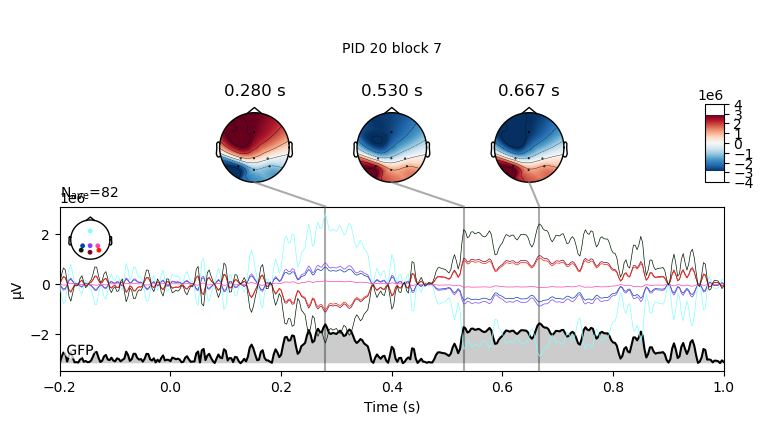

100%|██████████| 17/17 [01:08<00:00,  4.04s/it]


In [7]:
# ERP test
for n, pid in enumerate(tqdm.tqdm(lstPIds)):
    for x in range(1, NUM_BLOCKS+1):  
        
        if preprocess: epochs = clean_epochs[n][x-1] 
        else: epochs = mne.read_epochs('./fifs/clean/' + str(pid) + '-' + str(x) + '-epo.fif', preload=True)
        #epochs = clean_epochs[n][x-1]
        evoked = epochs.average()

        #Test plot
        ball_drop = epochs['spawn'].average()
        ts_args = dict(gfp=True, time_unit='s', spatial_colors=True)
        ball_drop.plot_joint(ts_args=ts_args, title="PID " + str(pid) + " block " + str(x))
        # noise_cov = mne.compute_covariance(epochs, tmax=0., method='shrunk', rank=None,
        #                     verbose='error')
        #evoked.plot_white(noise_cov=noise_cov, time_unit='s') 

In [8]:
# Compute powers
pws_lst = list()

for n, pid in enumerate(tqdm.tqdm(lstPIds)):
    for x in range(1, NUM_BLOCKS+1):  
        
        if preprocess: epochs = clean_epochs[n][x-1] 
        else: epochs = mne.read_epochs('./fifs/clean/' + str(pid) + '-' + str(x) + '-epo.fif', preload=True)
        #epochs = clean_epochs[n][x-1] 
        evoked = epochs.average()
        
        if(plot_plots):
    
            fig = plt.figure( figsize=(7, 3))
            subfigs = fig.subfigures(1, 2, wspace=0.07, width_ratios=[3., 1.])
            axs0 = subfigs[0].subplots(2, 1)
            subfigs[0].set_facecolor('0.9')

            epochs.compute_psd(method='multitaper', fmin=bands.theta[0], fmax = bands.theta[1]).plot(dB=False, axes = axs0[1], show = False)
            epochs.compute_psd(method='multitaper', fmin=bands.alpha[0], fmax = bands.alpha[1]).plot(dB = False, axes = axs0[0], show = False) #  .plot_topomap({'alpha': (8,12)},  normalize=True, axes=axes[1], show=False)
        
            axs1 = subfigs[1].subplots(2, 1)
            evoked.compute_psd(method='multitaper', fmin=bands.theta[0], fmax = bands.theta[1]).plot_topo(dB = False, axes = axs1[0], show = False)
            evoked.compute_psd(method='multitaper', fmin=bands.alpha[0], fmax = bands.alpha[1]).plot_topo(dB = False, axes = axs1[1], show = False)
            
            fig.set_constrained_layout(True)
            fig.suptitle("PID " + str(pid) + " block " + str(x))
            if(save_plots):
                filepath = "./Plots/PID_" + str(pid) + "-Block_" + str(x)  + "-raw_psd_topo.png"
                plt.savefig(filepath)

      
        ### Compute the power spectral density (PSD)
        for grp_nr in range(len(channel_groups)):
            
            #pick channels for different frequencies
            picks = mne.pick_types(epochs.info, eeg=True)
            picks_alpha = mne.pick_types(epochs.info, eeg=True, exclude=mask_channels(channel_groups[grp_nr][0]))
            picks_theta = mne.pick_types(epochs.info, eeg=True, exclude=mask_channels(channel_groups[grp_nr][1]))
                                    
            for m, method in enumerate(methods):
                
                #njob = "cuda" if cuda else -1
                njobs = 2 if method == 'welch' else -1
                
                psds, freqs = get_psd(epochs, method, picks) 
                # psds /= np.sum(psds, axis=-1, keepdims=True) 
                psds_mean = psds.mean(0)
                freq_res = freqs[1] - freqs[0]
    
                ## ALPHA
                psds_alpha, freqs_alpha = get_psd(epochs, method, picks_alpha)  
                psds_mean_alpha = psds_alpha.mean(0)
                freq_res_alpha = freqs_alpha[1] - freqs_alpha[0]
                
                #THETA
                psds_theta, freqs_theta = get_psd(epochs, method, picks_theta)            
                psds_mean_theta = psds_theta.mean(0)
                freq_res_theta = freqs_theta[1] - freqs_theta[0]
                
                # Find intersecting values in frequency vector
                idx_alpha = np.logical_and(freqs_alpha >= bands.alpha[0], freqs_alpha <= bands.alpha[1])
                idx_theta = np.logical_and(freqs_theta >= bands.theta[0], freqs_theta <= bands.theta[1])      
            
                # absolute power
                bp_alpha = simpson(psds_mean_alpha[idx_alpha], dx=freq_res_alpha)
                bp_theta = simpson(psds_mean_theta[idx_theta], dx=freq_res_theta) 
                bp_total = simpson(psds_mean, dx=freq_res)
                
                # relative power
                bp_alpha_rel =  bp_alpha / bp_total # alpha relative power
                bp_theta_rel = bp_theta / bp_total # theta relative power
 
                alpha_theta_total = bp_alpha / bp_theta
                alpha_theta_rel = bp_alpha_rel / bp_theta_rel       
                
                #peak power at freq
                peak_alpha = freqs_alpha[np.argmax(psds_mean_alpha[idx_alpha])]
                peak_theta = freqs_theta[np.argmax(psds_mean_theta[idx_theta])]

                # Extract the power values from the detected peaks
                # Plot the topographies across different frequency bands                         
                if(plot_plots):

                    fig, axes = plt.subplots(2, 2, figsize=(7, 3))
                    for ind, (label, band_def) in enumerate(bands):

                        # Create a topomap for the current oscillation band
                        epochs.compute_psd(method=method).plot_topomap({label: band_def}, ch_type='eeg',cmap='viridis', show_names=True, normalize=True, axes=axes[0, ind], show=False)
                        
                        axes[0,ind].set_title(method + " PSD topo " + label + ' power ' + str(channel_groups[grp_nr]), {'fontsize' : 7})
                        
                        idx = np.logical_and(freqs >= band_def[0], freqs <=  band_def[1])
                        psds_std = (psds_mean[idx]).std(0)
                        peak = freqs[np.argmax(psds_mean[idx])]
                        axes[1,ind].plot(freqs[idx], psds_mean[idx], color='k')
                        axes[1,ind].fill_between(freqs[idx], psds_mean[idx] - psds_std, psds_mean[idx] + psds_std,
                                        color='k', alpha=.5)
                        axes[1,ind].set_title(method + " PSD " + label + ' power', {'fontsize' : 7})
                    
                    fig.suptitle("PID " + str(pid) + " block " + str(x) + " " + str(channel_groups[grp_nr]))
                    fig.set_constrained_layout(True)
                    
                    if(save_plots):
                        filepath = "./Plots/PID_" + str(pid) + "-Block_" + str(x) + "-Group_" + str(grp_nr) + ".png"
                        plt.savefig(filepath)
            
                pws_lst.append([pid, x, bp_alpha, bp_theta, alpha_theta_total, grp_nr, method])
                   
        if(draw_plots):

            plt.show()

if preprocess: del(clean_epochs)

100%|██████████| 17/17 [01:26<00:00,  5.06s/it]


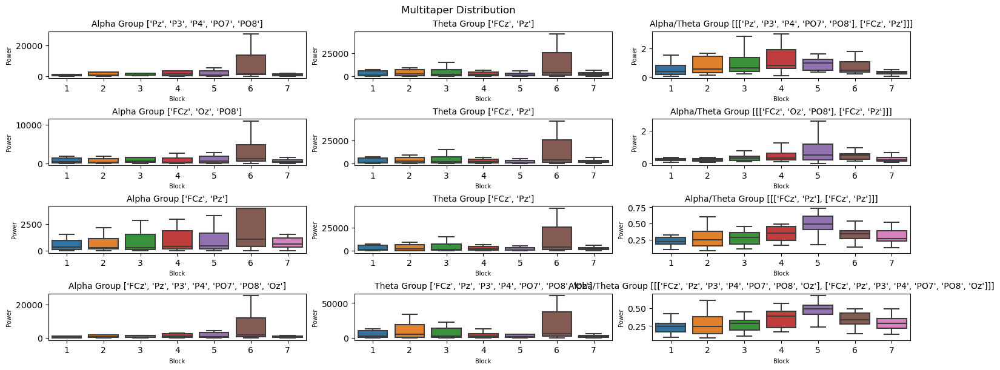

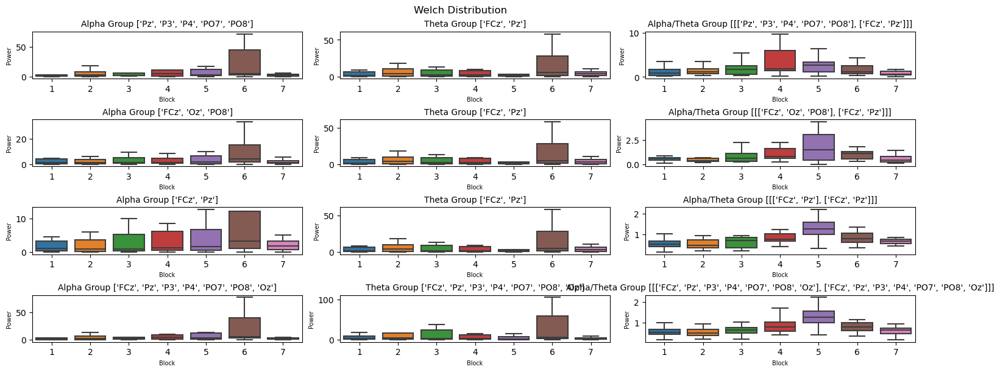

In [9]:
n_ch = len(channel_groups)
calc_powers = ['Alpha', 'Theta', 'Alpha/Theta']

f, axes = plt.subplots(n_ch, len(calc_powers), figsize=(15,6), constrained_layout=True, squeeze=False)
dfPowers  = pd.DataFrame(pws_lst, columns =['PID', 'BlockNumber', 'Alpha', 'Theta', 'Alpha/Theta', 'Group', 'Method'])

ax_idx = 1 if len(axes) > 1 else 0
for ch_grp in range(n_ch):
    for calc_power, ax1 in enumerate(axes[ax_idx]): # up to 3
        sns.boxplot(x = "BlockNumber", y = calc_powers[calc_power], data = dfPowers.loc[(dfPowers['Group'] == ch_grp) & (dfPowers['Method'] == 'multitaper')], ax=axes[ch_grp,calc_power],showfliers=False)
        #sns.stripplot(x="BlockNumber", y = ys[i], data=dfPowers.loc[(dfPowers['Group'] == y) & (dfPowers['Method'] == 'Multitaper')], marker="o", alpha=0.3, color="black", ax=axes[y,i])
        axes[ch_grp,calc_power].set_title( str(calc_powers[calc_power]) + " Group " + str(channel_groups[ch_grp][calc_power]), fontsize=10)
        axes[ch_grp,calc_power].set_ylabel('Power', fontsize=7)
        axes[ch_grp,calc_power].set_xlabel('Block', fontsize=7)
f.suptitle("Multitaper Distribution")

f, axes = plt.subplots(n_ch, len(calc_powers), figsize=(15,6), constrained_layout=True, squeeze=False)
ax_idx = 1 if len(axes) > 1 else 0
for ch_grp in range(n_ch):
    for calc_power, ax1 in enumerate(axes[ax_idx]):
        sns.boxplot(x = "BlockNumber", y = calc_powers[calc_power], data = dfPowers.loc[(dfPowers['Group'] == ch_grp) & (dfPowers['Method'] == 'welch')], ax=axes[ch_grp,calc_power],showfliers=False)
        axes[ch_grp,calc_power].set_title( str(calc_powers[calc_power]) + " Group " +  str(channel_groups[ch_grp][calc_power]), fontsize=10)
        axes[ch_grp,calc_power].set_ylabel('Power', fontsize=7)
        axes[ch_grp,calc_power].set_xlabel('Block', fontsize=7)
f.suptitle("Welch Distribution")

plt.show()

In [10]:
dfPowers.to_pickle('./pickles/dfPowers.pickle')